# From Patterns to Predictions: Identifying Fraudulent Job Listings in Application Tracking Systems for Recruitment


# Table of Contents
- **[Introduction](#Intro)**
- **[A: Get the Data](#A)**
- **[B: Explore the Data](#B)**
  - [B1: Study Each Attribute and Its Characteristics](#B1)
  - [B2: Visualisations and Correlations](#B2)
    - [The Target Attribute](#B2.1)
    - [Correlation Matrix](#B2.2)
    - [Initial Text Analysis](#B2.3)
    - [Categorical Variables](#B2.4)
    - [Binary Variables](#B2.5)
- **[C: Prepare the Data](#C)**
  - [C1: Data Cleaning - Dealing with Missing Values](#C1)
  - [C2: Data Cleaning - Location Variable Transformation](#C2)
  - [C3: Data Cleaning – Outliers](#C3)
  - [C4: Data Cleaning - Text Preprocessing](#C4)
    - [Text Cleaning](#C4.1)
    - [Text Analysis Part II](#C4.2)
    - [ Word Embedding](#C4.3)
  - [C5: Data Cleaning - Encode Categorical Features](#C5)
  - [C6: SMOTEENN, Test-Train Split & Standardisation](#C6)
- **[D: Models](#D)**
  - [D1: Logistic Regression](#D1)
    - [Feature Selection](#D1.1)
    - [Model Performance](#D1.2)
  - [D2: Random Forest](#D2)
    - [Random Forest with Default Arguments](#D2.1)
    - [Model Performance](#D2.2)
    - [Random Forest with Best Estimators (Hyperparameter Tuning)](#D2.3)
    - [Model Performance](#D2.4)
  - [D3: Support Vector Machines (SVM)](#D3)
    - [Model Performance](#D3.1)
  - [D4: XGBoost Classifier](#D4)
    - [Model Performance](#D4.1)
  - [D5: Model Evaluation and Comparison](#D5)
- **[Conclusion](#CONC)**
- **[Appendix](#App)**
  - [1. Error Matrix Definitions](#App1)
  - [2. Model Definitions](#App2)
  - [3. Artifical General Intelligence Usage](#App3)
- **[Project Management](#PM)**
  - [Trello](#PM1)
- **[Bibliography](#Bib)**

<a id="Intro"></a>
# Introduction 

Modern companies widely use cloud-based Application Tracking Systems (ATS) for recruitment, streamlining processes from job posting to hiring (Vidros, et al., 2017). However, this has led to increased recruitment fraud, with scammers using fake job postings to collect CVs and personal data. In light of this issue, this project aims to help platforms like LinkedIn, Indeed, and Glassdoor detect and remove fraudulent job postings, preventing recruitment scams from the start.

<a id="A"></a>
# A: Get the data

The data for this project, sourced from Kaggle (Kaggle, 2019), was originally collected by the Laboratory of Information & Communication Systems Security at the University of the Aegean for research purposes and published between 2012 and 2014 (University of the Aegean, 2017). The dataset comprises 17,880 real job descriptions from “Workable”, including 802 identified as fake (Vidros, et al., 2017). It contains 17 variables, featuring a mix of both numerical and character types. The feature ‘fraudulent’ is the target variable for our analysis. It takes the value of either 0 or 1, indicating whether a job posting is genuine or fraudulent. 

In [ ]:
# Run this cell block for faculty
!pip install kmodes
!pip install emoji
!pip install xgboost
!pip install imblearn
!pip install wordcloud

In [1]:
# To display full output in Notebook, instead of only the last result
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
# Data Preparation
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from ast import literal_eval

# Clustering and Evaluation
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from kmodes.kmodes import KModes
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

# Text Processing
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
import re
import string
import emoji
# nltk.download('stopwords')
# nltk.download('punkt')

# Machine Learning Models
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn import tree
from sklearn import svm
import xgboost as xgb

# Feature Selection
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression

# Model Tuning
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold

# Imbalanced Data Handling and Scaling
from imblearn.combine import SMOTEENN
from sklearn.preprocessing import StandardScaler

# Data Visualization
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import seaborn as sns
from wordcloud import WordCloud
import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'notebook'

# Logging and Warnings
import logging
import warnings
# Configure logging levels
logging.getLogger('matplotlib').setLevel(logging.WARNING)
logging.getLogger('gensim').setLevel(logging.WARNING)
# Suppress warnings
warnings.filterwarnings(action='ignore', category=UserWarning, module='gensim')
warnings.filterwarnings('ignore')  # Suppress all warnings
warnings.filterwarnings('ignore', message='posx and posy should be finite values')  # Specific matplotlib warnings


In [3]:
# This code block is all about loading in Google's pre-trained Word2Vec model
# This is going to be used for word embedding 
# The process converts words or tokens into continuous vector representations in a high-dimensional space

from gensim.models.keyedvectors import KeyedVectors

# Configure logging to display information during model loading
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

from gensim.models import KeyedVectors

# Specify the path to the pre-trained Word2Vec model (Google News vectors)
path = r'/Users/kayleedekker/Library/Mobile Documents/com~apple~CloudDocs/Documents/aa - UCL/Business Analytics/Programming/Group project/GoogleNews-vectors-negative300.bin'

# Load Google's pre-trained Word2Vec model
model = KeyedVectors.load_word2vec_format(path, binary=True)

# Print the vocabulary size of the loaded model
print("vocab_size:", len(model.key_to_index))

# Limit the loaded model to a subset of vocabulary (e.g., top 200,000 words)
model = KeyedVectors.load_word2vec_format(path, binary=True, limit=200000)

# Print the vocabulary size of the limited model
print("vocab_size:", len(model.key_to_index))

vocab_size: 3000000
vocab_size: 200000


In [6]:
# Load dataset 
df = pd.read_csv("fake_job_postings.csv")

In [7]:
# Finding the number of columns and rows in the dataframe
num_columns = df.shape[1]
num_rows = df.shape[0]

# Output using string formatting
output = f"""How many columns are in our dataframe?
ANS: There are {num_columns} columns in our dataframe 

How many rows are in our dataframe?
ANS: There are {num_rows} rows in our dataframe, ensuring a large enough sample for our analysis"""

print(output)

How many columns are in our dataframe?
ANS: There are 18 columns in our dataframe 

How many rows are in our dataframe?
ANS: There are 17880 rows in our dataframe, ensuring a large enough sample for our analysis


In [8]:
# View the data
df.head()

# View the missing values and datatypes 
df.info()

# Describe the integer variables 
df.describe()

,job_id,title,location,department,salary_range,company_profile,description,requirements,benefits,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,industry,function,fraudulent
0,1,Marketing Intern,"US, NY, New York",Marketing,NaN,"We're Food52, and we've created a groundbreaki...","Food52, a fast-growing, James Beard Award-winn...",Experience with content management systems a m...,NaN,0,1,0,Other,Internship,NaN,NaN,Marketing,0
1,2,Customer Service - Cloud Video Production,"NZ, , Auckland",Success,NaN,"90 Seconds, the worlds Cloud Video Production ...",Organised - Focused - Vibrant - Awesome!Do you...,What we expect from you:Your key responsibilit...,What you will get from usThrough being part of...,0,1,0,Full-time,Not Applicable,NaN,Marketing and Advertising,Customer Service,0
2,3,Commissioning Machinery Assistant (CMA),"US, IA, Wever",NaN,NaN,Valor Services provides Workforce Solutions th...,"Our client, located in Houston, is actively se...",Implement pre-commissioning and commissioning ...,NaN,0,1,0,NaN,NaN,NaN,NaN,NaN,0
3,4,Account Executive - Washington DC,"US, DC, Washington",Sales,NaN,Our passion for improving quality of life thro...,THE COMPANY: ESRI – Environmental Systems Rese...,"EDUCATION: Bachelor’s or Master’s in GIS, busi...",Our culture is anything but corporate—we have ...,0,1,0,Full-time,Mid-Senior level,Bachelor's Degree,Computer Software,Sales,0
4,5,Bill Review Manager,"US, FL, Fort Worth",NaN,NaN,SpotSource Solutions LLC is a Global Human Cap...,JOB TITLE: Itemization Review ManagerLOCATION:...,QUALIFICATIONS:RN license in the State of Texa...,Full Benefits Offered,0,1,1,Full-time,Mid-Senior level,Bachelor's Degree,Hospital & Health Care,Health Care Provider,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17880 entries, 0 to 17879
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   job_id               17880 non-null  int64 
 1   title                17880 non-null  object
 2   location             17534 non-null  object
 3   department           6333 non-null   object
 4   salary_range         2868 non-null   object
 5   company_profile      14572 non-null  object
 6   description          17879 non-null  object
 7   requirements         15185 non-null  object
 8   benefits             10670 non-null  object
 9   telecommuting        17880 non-null  int64 
 10  has_company_logo     17880 non-null  int64 
 11  has_questions        17880 non-null  int64 
 12  employment_type      14409 non-null  object
 13  required_experience  10830 non-null  object
 14  required_education   9775 non-null   object
 15  industry             12977 non-null  object
 16  func

,job_id,telecommuting,has_company_logo,has_questions,fraudulent
count,17880.000000,17880.000000,17880.000000,17880.000000,17880.000000
mean,8940.500000,0.042897,0.795302,0.491723,0.048434
std,5161.655742,0.202631,0.403492,0.499945,0.214688
min,1.000000,0.000000,0.000000,0.000000,0.000000
25%,4470.750000,0.000000,1.000000,0.000000,0.000000
50%,8940.500000,0.000000,1.000000,0.000000,0.000000
75%,13410.250000,0.000000,1.000000,1.000000,0.000000
max,17880.000000,1.000000,1.000000,1.000000,1.000000


<a id="B"></a>

# B: Explore the data

<a id="B1"></a>

## B1: Study each attribute and its characteristics

In [9]:
# Create a copy of the DataFrame to preserve the original data and avoid unintended modifications
df_job = df.copy()

In [10]:
# Create a table displaying each column, data type, and example value
# Create an empty DataFrame to store the results
datatype_df = pd.DataFrame(columns=['Column Title', 'Data Type', 'Example Value'])

# Iterate through columns of 'df_job'
for column_name, data_type in df_job.dtypes.items():
    # Get the first non-null value from the column as an example value
    example_value = df_job[column_name].dropna().iloc[0]

    # Append the column information to the result DataFrame
    datatype_df = pd.concat([datatype_df, pd.DataFrame({'Column Title': [column_name], 'Data Type': [data_type], 'Example Value': [example_value]})], ignore_index=True)

# Print the resulting DataFrame
datatype_df.head(20)



def missing_values_info(df, columns):
    """
    Generate a DataFrame listing column titles and their missing percentages for specified columns.

    Parameters:
    - df (DataFrame): The DataFrame to analyze.
    - columns (list): List of column names to include in the DataFrame.

    Returns:
    - DataFrame: A DataFrame containing 'Column Title' and 'Missing Percentage' columns.
    """
    missing_df = pd.DataFrame(columns=['Column Title', 'Missing Percentage'])

    for column_name in columns:
        missing_percentage = round((df[column_name].isnull().sum() / len(df)) * 100, 1)
        missing_df = pd.concat([missing_df, pd.DataFrame({'Column Title': [column_name], 'Missing Percentage': [missing_percentage]})], ignore_index=True)

    return missing_df

# Run the missing values info function
missing_info_df = missing_values_info(df_job, list(df_job.columns))
missing_info_df.head(20)


,Column Title,Data Type,Example Value
0,job_id,int64,1
1,title,object,Marketing Intern
2,location,object,"US, NY, New York"
3,department,object,Marketing
4,salary_range,object,20000-28000
5,company_profile,object,"We're Food52, and we've created a groundbreaki..."
6,description,object,"Food52, a fast-growing, James Beard Award-winn..."
7,requirements,object,Experience with content management systems a m...
8,benefits,object,What you will get from usThrough being part of...
9,telecommuting,int64,0


,Column Title,Missing Percentage
0,job_id,0.0
1,title,0.0
2,location,1.9
3,department,64.6
4,salary_range,84.0
5,company_profile,18.5
6,description,0.0
7,requirements,15.1
8,benefits,40.3
9,telecommuting,0.0


In [11]:
# Now, let's explore categorical features 

def explore_categorical_features(df, categorical_columns):
    """
    Explore and summarize unique values of categorical features in a DataFrame.

    Parameters:
    - df (DataFrame): The DataFrame to explore.
    - categorical_columns (list): List of categorical column names.

    Returns:
    - DataFrame: A DataFrame containing information about the unique values in the specified columns.
    """
    df_unique_cat = pd.DataFrame(columns=['Column Name', 'Unique Value Count', 'Unique Values'])
    dfs = []

    for column_name in categorical_columns:
        unique_value_count = df[column_name].nunique()
        unique_values = df[column_name].unique()

        df_temp = pd.DataFrame({'Column Name': [column_name], 'Unique Value Count': [unique_value_count], 'Unique Values': [unique_values]})
        dfs.append(df_temp)

    df_unique_cat = pd.concat(dfs, ignore_index=True)
    
    return df_unique_cat
                                
# List the categorical features
categorical_columns = ['location', 'employment_type', 'required_experience', 'required_education', 'industry', 'function']

# Call the function to explore categorical features
df_unique_cat = explore_categorical_features(df_job, categorical_columns)
df_unique_cat.head(10)


,Column Name,Unique Value Count,Unique Values
0,location,3105,"[US, NY, New York, NZ, , Auckland, US, IA, Wev..."
1,employment_type,5,"[Other, Full-time, nan, Part-time, Contract, T..."
2,required_experience,7,"[Internship, Not Applicable, nan, Mid-Senior l..."
3,required_education,13,"[nan, Bachelor's Degree, Master's Degree, High..."
4,industry,131,"[nan, Marketing and Advertising, Computer Soft..."
5,function,37,"[Marketing, Customer Service, nan, Sales, Heal..."


In [12]:
# Verify the distributions of binary variables
# List of binary columns in the dataset
binary_columns = ['telecommuting', 'has_company_logo', 'has_questions', 'fraudulent']

# Looping through binary columns to check their distribution
for col in binary_columns:
    # Using value_counts with normalize=True to get distribution percentages
    # These binary variables follow a Bernoulli distribution
    # The distribution reflects real-world proportions and asymmetry in binary outcomes
    distribution = df_job[col].value_counts(normalize=True)
    print(f"Distribution for {col}:\n{distribution}\n")

# Note: Detailed exploration of data attributes, including binary, categorical, 
# and text variables, is covered in section B2 of the assignment.
# Binary variables verified to strictly contain 0s and 1s, ensuring data consistency

# Additional Note: For handling textual data noise (like spelling errors, 
# inconsistent language usage), refer to preprocessing techniques discussed in Section C.
# Techniques include stemming, stop-word removal, and using word clouds for visualization


Distribution for telecommuting:
0    0.957103
1    0.042897
Name: telecommuting, dtype: float64

Distribution for has_company_logo:
1    0.795302
0    0.204698
Name: has_company_logo, dtype: float64

Distribution for has_questions:
0    0.508277
1    0.491723
Name: has_questions, dtype: float64

Distribution for fraudulent:
0    0.951566
1    0.048434
Name: fraudulent, dtype: float64



<a id="B2"></a>
## B2: Visualisations and correlations

<a id="B2.1"></a>
### The target attribute

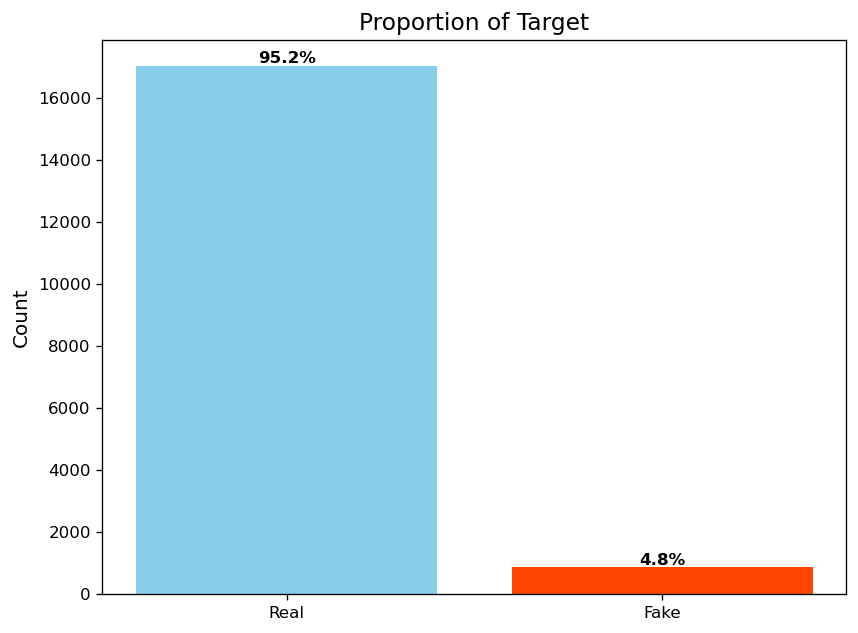

In [13]:
# Filter fraudulent job
fraudulent_counts = df_job["fraudulent"].value_counts()

fraud_labels = ["Real", "Fake"]
fraud_colors = ['skyblue', 'orangered']  # Colors for real and fraudulent

# Create a vertical bar chart
plt.figure(figsize=(8, 6), dpi=120)  # Improved image quality with dpi setting
plt.bar(fraud_labels, fraudulent_counts, color=fraud_colors)
plt.ylabel('Count', fontsize=12);
plt.title('Proportion of Target', fontsize=14);

# Add percentage labels on the bars
total_count = fraudulent_counts.sum()
for i, count in enumerate(fraudulent_counts):
    percentage = (count / total_count) * 100
    plt.text(i, count, f'{percentage:.1f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.show();

In [14]:
print(fraudulent_counts)

0    17014
1      866
Name: fraudulent, dtype: int64


The graph indicates a class imbalance with 95.2% of job postings being genuine and 4.8% fraudulent. This imbalance could skew machine learning models towards predicting mostly real jobs. Therefore, we’ll use the SMOTEENN technique, explained later.

<a id="B2.2"></a>
### Correlation matrix

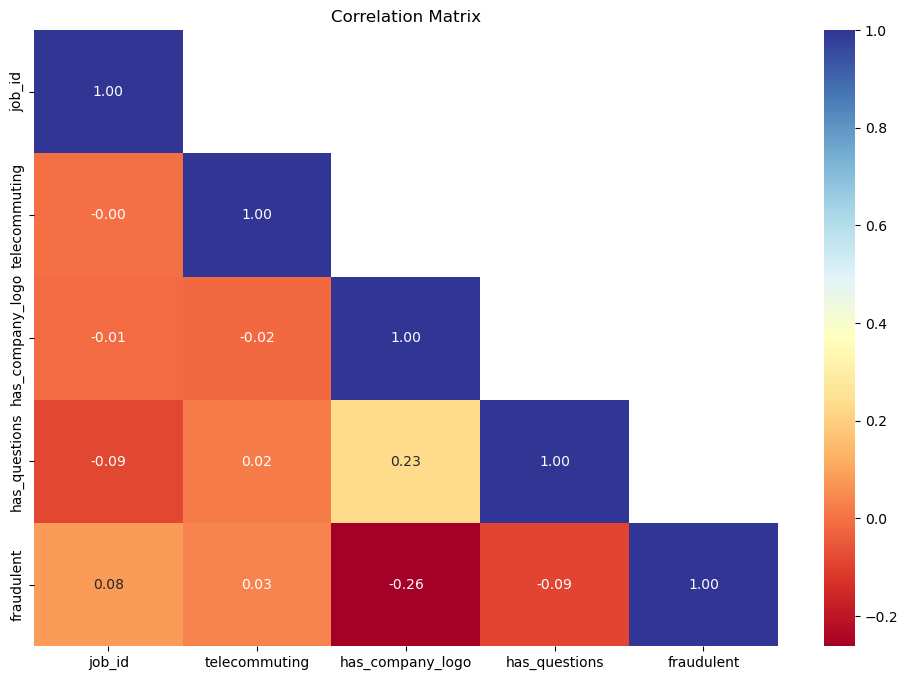

In [15]:
# Calculate the correlation matrix
correlation_matrix = df_job.corr()

# Filter out the lower triangular part (below the middle diagonal)
mask = np.tril(np.ones_like(correlation_matrix, dtype=bool))

# Create a figure and set its size
plt.figure(figsize=(12, 8))

# Create a heatmap of the correlation matrix with annotations
sns.heatmap(correlation_matrix, annot=True, cmap="RdYlBu", fmt=".2f", mask=~mask)

# Set the title for the heatmap
plt.title("Correlation Matrix");

# Show the heatmap
plt.show();

The correlation matrix demonstrated weak correlations between variables, suggesting minimal multicollinearity in our dataset. Interestingly, the "has_company_logo" variable has a moderate negative correlation with "fraudulent" (-0.26). This suggests that the absence of a company logo might be associated with fraudulent job postings. 

<a id="B2.3"></a>
### Initial text analysis

In [16]:
# Create a plot of character count function
def plot_character_length(df, column_name, title):
    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(17, 5), dpi=100)

    # Calculate the character length for fake posts
    length_fake = df[df["fraudulent"] == 1][column_name].str.len()

    # Create a histogram for character length in the first subplot (fake posts)
    ax1.hist(length_fake, bins=20, color='orangered', range=(0, length_fake.max()/3))  # Adjust the range
    ax1.set_title('Fake Job Listing')

    # Calculate the character length for real posts
    length_real = df[df["fraudulent"] == 0][column_name].str.len()

    # Create a histogram for character length in the second subplot (real posts)
    ax2.hist(length_real, bins=20, color='skyblue', range=(0, length_real.max()/3))  # Adjust the range
    ax2.set_title('Real Job Listing')

    # Set the title for the entire figure
    fig.suptitle(title)
    
    # Set the x and y axis limits to be the same for both subplots
    ax1.set_xlim(ax2.get_xlim())

    # Display the plot
    plt.show()

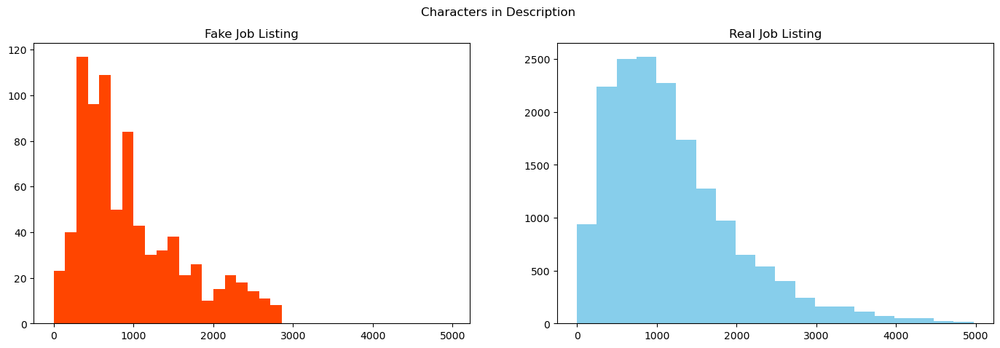

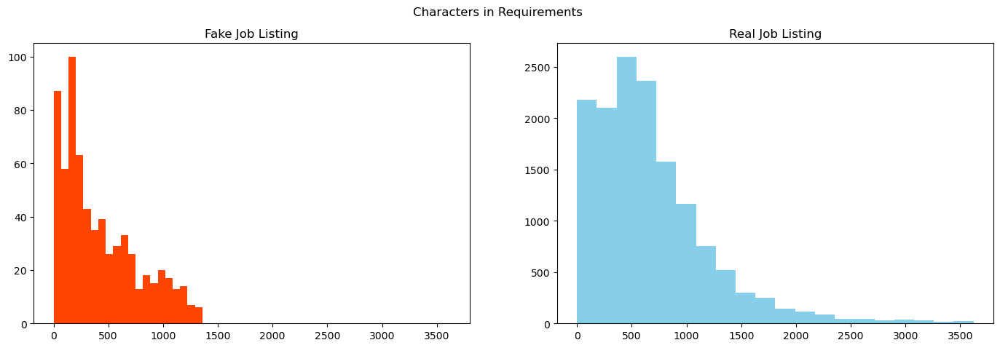

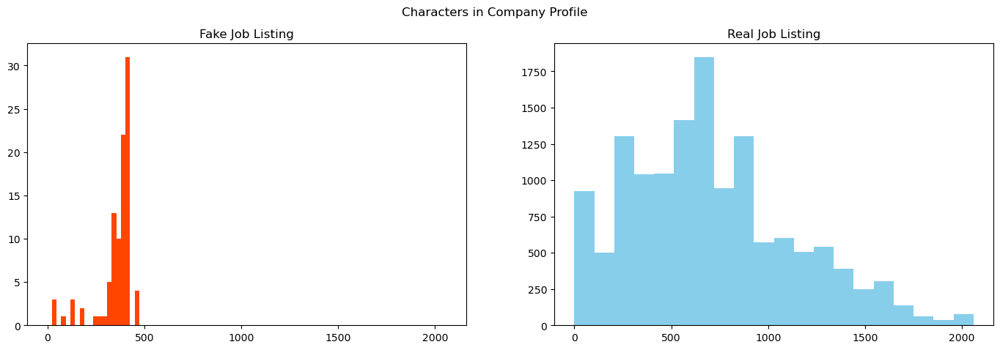

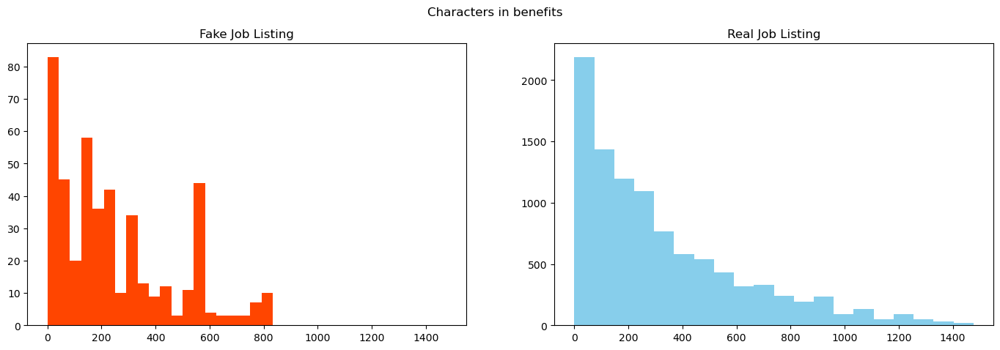

In [17]:
# Call the function and draw the plots of character count in description
plot_character_length(df_job, 'description', 'Characters in Description')

# Create line spacing 
print("\n")

# Call the function and draw the plot of character count in Requirement for Fake and Real post
plot_character_length(df_job, 'requirements', 'Characters in Requirements')

# Create line spacing 
print("\n")

# Call the function and draw the plot of character count in Company Profile
plot_character_length(df_job, 'company_profile', 'Characters in Company Profile')

# Create line spacing 
print("\n")

# Call the function and draw the plot of character count in Benefits
plot_character_length(df_job, 'benefits', 'Characters in benefits')

Histograms reveal that fraudulent job postings often have a limited range of character counts, most notable in company profiles, suggesting less detail compared to real postings which show wider character counts. While extensive character counts in job texts can hint at legitimacy, shorter counts are not reliable indicators of fraud, as many genuine postings also use shorter character counts. 

<a id="B2.4"></a>
### Categorical variables

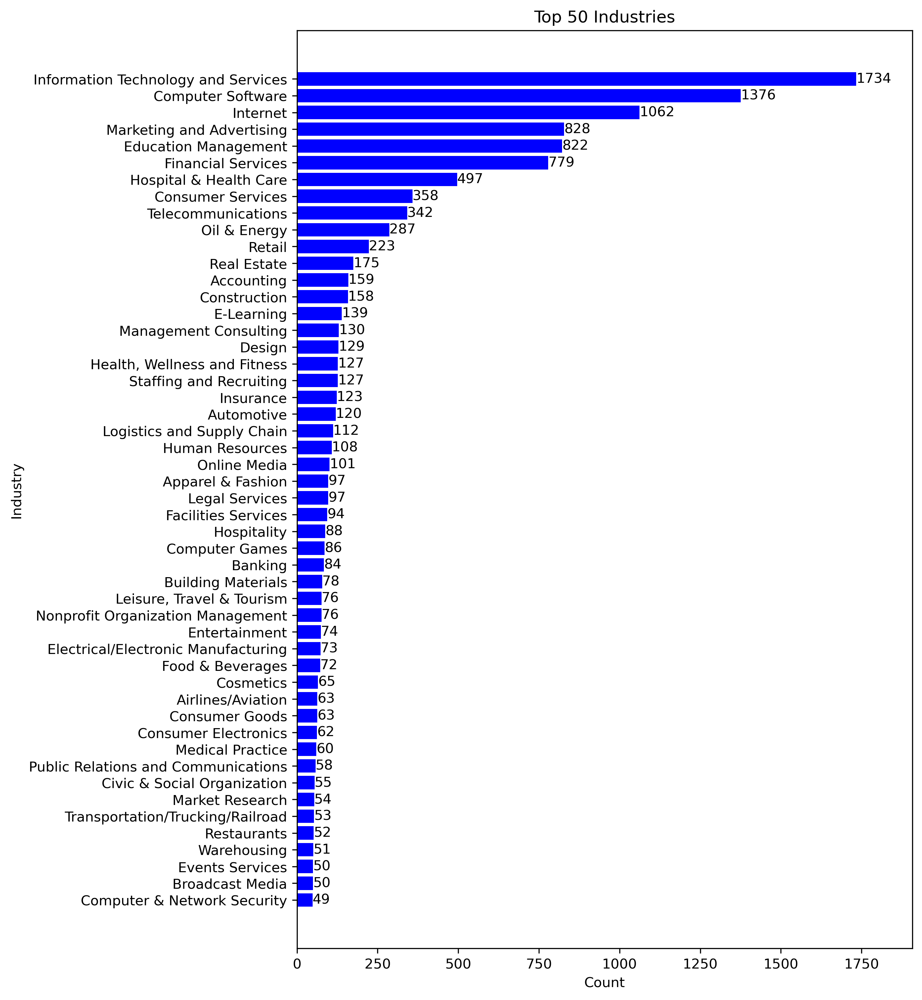

In [ ]:
# Create a plot that visualises the most common industries in our dataset
def plot_top_industries(df, top_n=50):
    # Get the counts of each industry
    industry_counts = df['industry'].value_counts().head(top_n)

    # Create a horizontal bar chart
    plt.figure(figsize=(8, 12), dpi = 300) # Improved image quality with dpi setting
    bars = plt.barh(industry_counts.index, industry_counts.values, color='blue')
    plt.xlabel('Count')
    plt.ylabel('Industry')
    plt.title(f'Top {top_n} Industries')
    plt.gca().invert_yaxis()  # Invert the y-axis to display the most frequent industries at the top

    # Annotate each bar with its count
    for bar, count in zip(bars, industry_counts.values):
        plt.text(count, bar.get_y() + bar.get_height()/2, str(count), ha='left', va='center', fontsize=10, color='black')

    # Adjust the limits to fit the text inside the plot
    plt.xlim(0, max(industry_counts.values) * 1.1)
    
    plt.show()

# Call the function with the DataFrame
plot_top_industries(df_job)

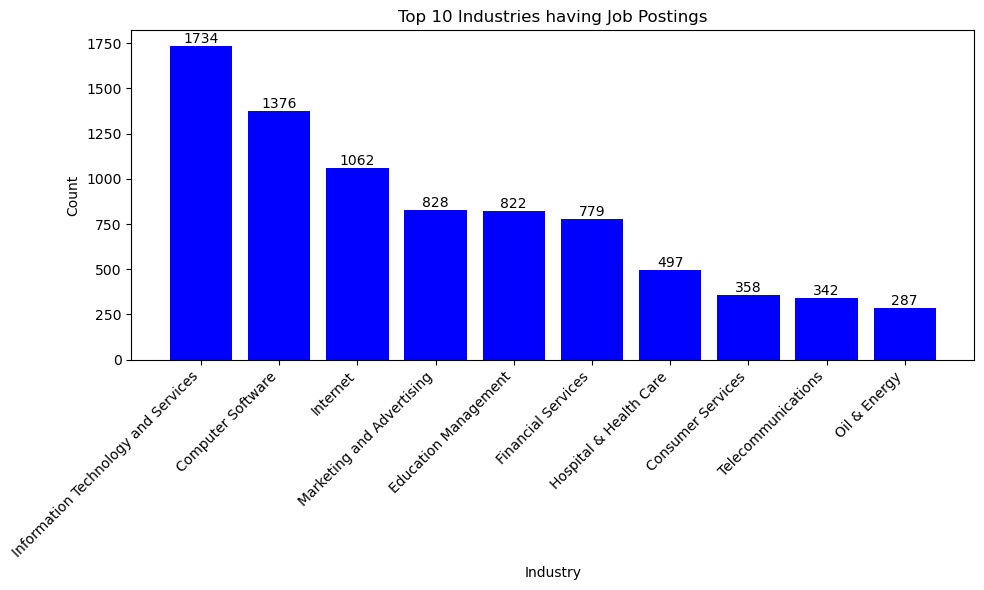

In [19]:
# Extract the 'industry' column from the dataframe
industry = df_job["industry"]

# Count the occurrences of each industry to get the number of job postings per industry
industry_counts = industry.value_counts()

# Select the top 10 industries with the highest count of job postings
top_10_industry = industry_counts.head(10)

# Set up the figure and axis for the bar chart, specify figure size
plt.figure(figsize=(10, 6));

# Create a vertical bar chart
# The bar function defaults to vertical bars, and the first argument is the x-coordinates
plt.bar(top_10_industry.index, top_10_industry.values, color='blue');

# Label the y-axis as 'Count'
plt.ylabel("Count");

# Label the x-axis as 'Industry'
plt.xlabel("Industry");

# Set the title of the chart
plt.title("Top 10 Industries having Job Postings");

# Annotate the value on top of each bar
for index, value in enumerate(top_10_industry.values):
    plt.text(index, value, str(value), ha='center', va='bottom');  # Horizontal alignment is center, vertical is bottom.

# Rotate x-axis labels for better readability, aligning them to the right for uniformity
plt.xticks(rotation=45, ha='right');

# Adjust subplots to fit the figure area (useful if labels are getting cut off)
plt.tight_layout();

# Display the chart
plt.show();

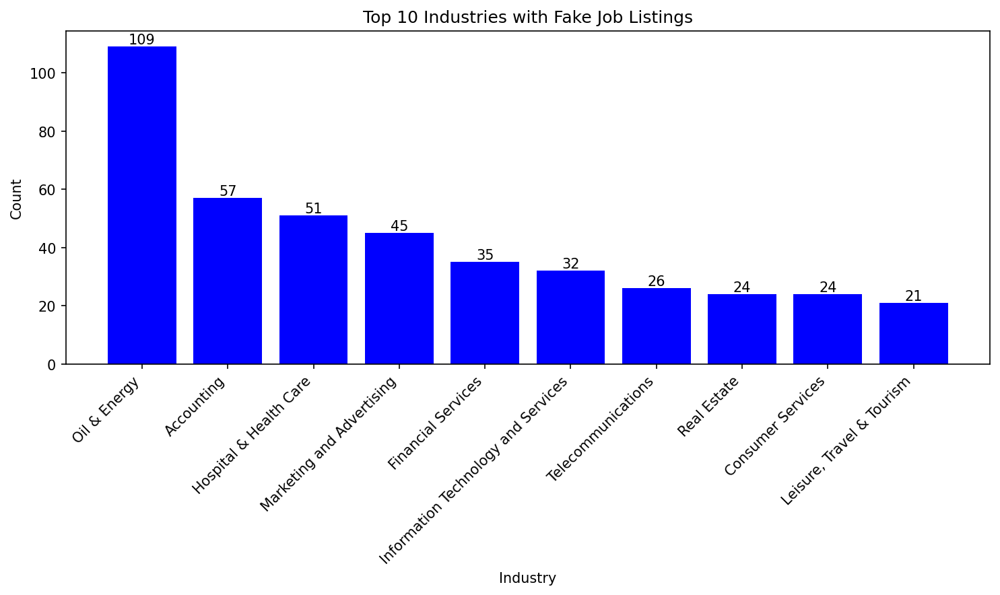

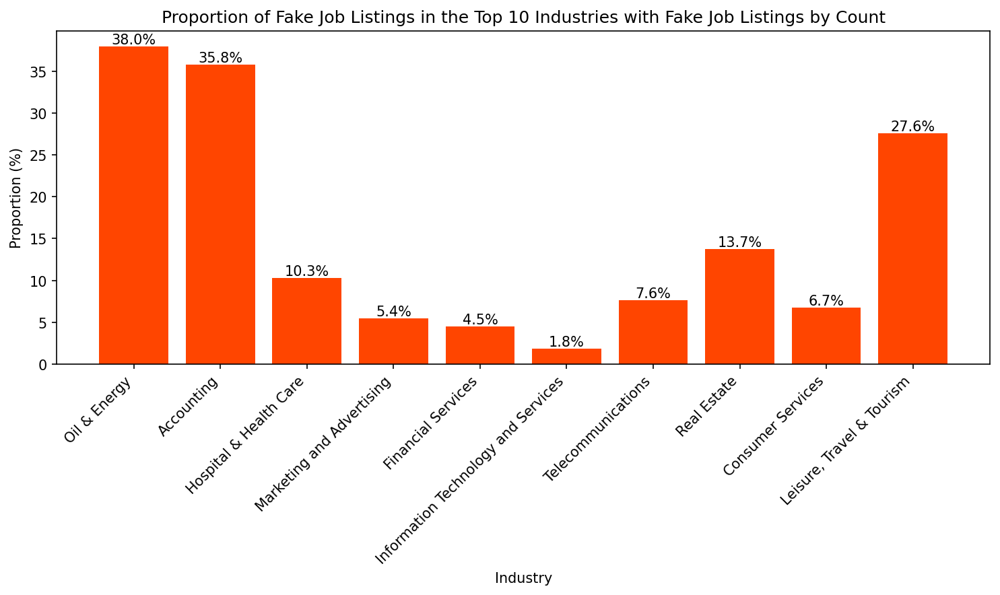

In [23]:
def plot_top_fraudulent_industries(df_job):
    """
    Plots a bar chart showing the top 10 industries with the highest number of fraudulent job postings.

    Parameters:
    df_job (DataFrame): A pandas DataFrame containing job posting data with columns 'fraudulent' and 'industry'.

    The function extracts fraudulent job postings, counts occurrences in each industry, 
    and plots a bar chart for the top 10 industries based on the count.
    """

    # Select industries from fraudulent job postings
    fraudulent_industry = df_job[df_job["fraudulent"] == 1]["industry"]

    # Count the occurrences of each industry in fraudulent job postings
    fraudulent_industry_counts = fraudulent_industry.value_counts()

    # Select the top 10 industries with the highest number of fraudulent job postings
    top_10_fraudulent_industry = fraudulent_industry_counts.head(10)

    # Set up the figure for the bar chart
    plt.figure(figsize=(10, 6), dpi=150)

    # Create a vertical bar chart with bars colored in blue
    plt.bar(top_10_fraudulent_industry.index, top_10_fraudulent_industry.values, color='blue')

    # Label the y-axis as 'Count'
    plt.ylabel("Count")

    # Label the x-axis as 'Industry'
    plt.xlabel("Industry")

    # Set the title of the chart
    plt.title("Top 10 Industries with Fake Job Listings")

    # Annotate the value on top of each bar
    for index, value in enumerate(top_10_fraudulent_industry.values):
        # Horizontal alignment is center, vertical is bottom (to place the text above the bars)
        plt.text(index, value, str(value), ha='center', va='bottom')

    # Optionally rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')

    # Adjust the layout
    plt.tight_layout()

    # Display the chart
    plt.show()


# To get more insight from industry, we compare the propotion of fake post in each industry.
def plot_top_10_fraudulent_industries_proportion(df_job):
    """
    Plots the proportion of fraudulent job postings for the top 10 industries by count.
    
    Parameters:
    df_job (DataFrame): A DataFrame containing job listing data with 'industry' and 'fraudulent' columns.
    
    Returns:
    None: This function does not return anything. It generates a bar chart.
    """
    # Calculate the count of job postings for each industry
    industry_counts = df_job['industry'].value_counts()

    # Calculate the count of fraudulent job postings for each industry
    fraudulent_industry_counts = df_job[df_job['fraudulent'] == 1]['industry'].value_counts()

    # Select the top 10 industries by fraudulent count
    top_10_fraudulent_industries = fraudulent_industry_counts.head(10).index

    # Calculate the proportions of fraudulent postings for these top 10 industries
    proportion_of_fraudulent = (fraudulent_industry_counts / industry_counts * 100).loc[top_10_fraudulent_industries]

    # Plotting the proportions for the top 10 industries
    plt.figure(figsize=(10, 6), dpi=150)  # Define the size of the figure
    plt.bar(proportion_of_fraudulent.index, proportion_of_fraudulent.values, color='orangered')  # Create the bars

    # Label the y-axis and x-axis
    plt.ylabel("Proportion (%)")
    plt.xlabel("Industry")

    # Set the title of the chart
    plt.title("Proportion of Fake Job Listings in the Top 10 Industries with Fake Job Listings by Count")

    # Annotate the proportion on top of each bar
    for index, value in enumerate(proportion_of_fraudulent.values):
        plt.text(index, value, f'{value:.1f}%', ha='center', va='bottom', fontsize=10, color='black')

    # Adjust the layout and display the chart
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


# Plot the top ten industries with the highest fraduluence count
plot_top_fraudulent_industries(df_job)

print("\n")

# Plot the proportion of fraudulent job postings in the top 10 industries.
plot_top_10_fraudulent_industries_proportion(df_job)

In [28]:
# Exploring the distribution in other categorical variables 
# Create the functions in this code block

# Create a function that explores categorical variables and their distributions 
def plot_unique_values_and_counts(df, categorical_columns):
    """
    Plot unique values and their counts for specified categorical columns in a DataFrame.

    Parameters:
    - df (DataFrame): The DataFrame to analyze.
    - categorical_columns (list): List of categorical column names.

    Returns:
    - None
    """
    for i, column_name in enumerate(categorical_columns):
        unique_values_counts = df[column_name].value_counts(dropna=False)
        
        plt.figure(figsize=(12, 8), dpi = 300)  # Set the figure size # figsize=(12, 8), dpi = 300
        x_values = unique_values_counts.index.astype(str)  # Convert x-axis values to strings
        y_values = unique_values_counts.values
        
        plt.bar(x_values, y_values, color = 'blue')
        plt.xlabel(column_name)
        plt.ylabel('Count')
        plt.title(f'Unique values in {column_name}')
        plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
        plt.tight_layout()  # Ensure labels fit within the plot area
        
        # Add labels to each bar
        for x, y in zip(x_values, y_values):
            plt.text(x, y, str(y), ha='center', va='bottom')
        
        plt.show()


# Now create a function that visualises the proportion of fake job listings in each unique value of the category
def plot_proportion_of_fake_job_listings(df, categorical_columns):
    """
    Plot the proportion of fake job listings for specified categorical columns in a DataFrame.

    Parameters:
    - df (DataFrame): The DataFrame to analyze.
    - categorical_columns (list): List of categorical column names.

    Returns:
    - None
    """
    # Filter to include only fake job listings
    fake_df = df[df['fraudulent'] == 1]

    for i, column_name in enumerate(categorical_columns):
        # Calculate the proportion of fake job listings in each category
        fake_counts = fake_df[column_name].value_counts(dropna=False)
        total_counts = df[column_name].value_counts(dropna=False)
        proportions = (fake_counts / total_counts) * 100

        plt.figure(figsize=(12, 8), dpi=300)  # Set the figure size
        x_values = proportions.index.astype(str)  # Convert x-axis values to strings
        y_values = proportions.values

        plt.bar(x_values, y_values, color='orangered')
        plt.xlabel(column_name)
        plt.ylabel('Proportion of Fake Listings (%)')
        plt.title(f'Proportion of Fake Job Listings in {column_name}')
        plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
        plt.tight_layout()  # Ensure labels fit within the plot area

        # Add labels to each bar
        for x, y in zip(x_values, y_values):
            plt.text(x, y, f'{y:.2f}%', ha='center', va='bottom')

        plt.show()

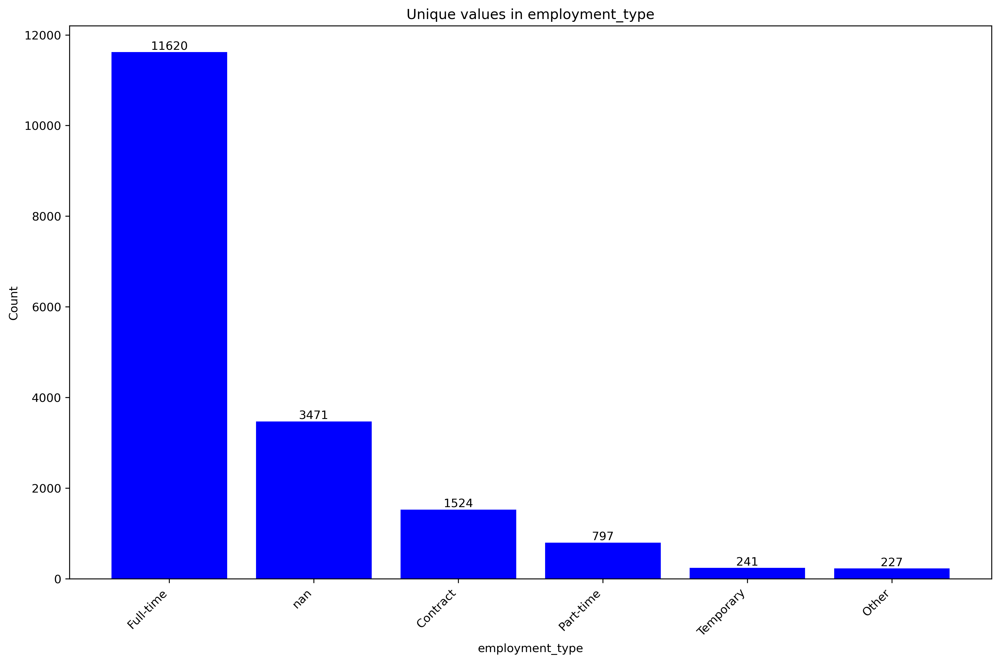

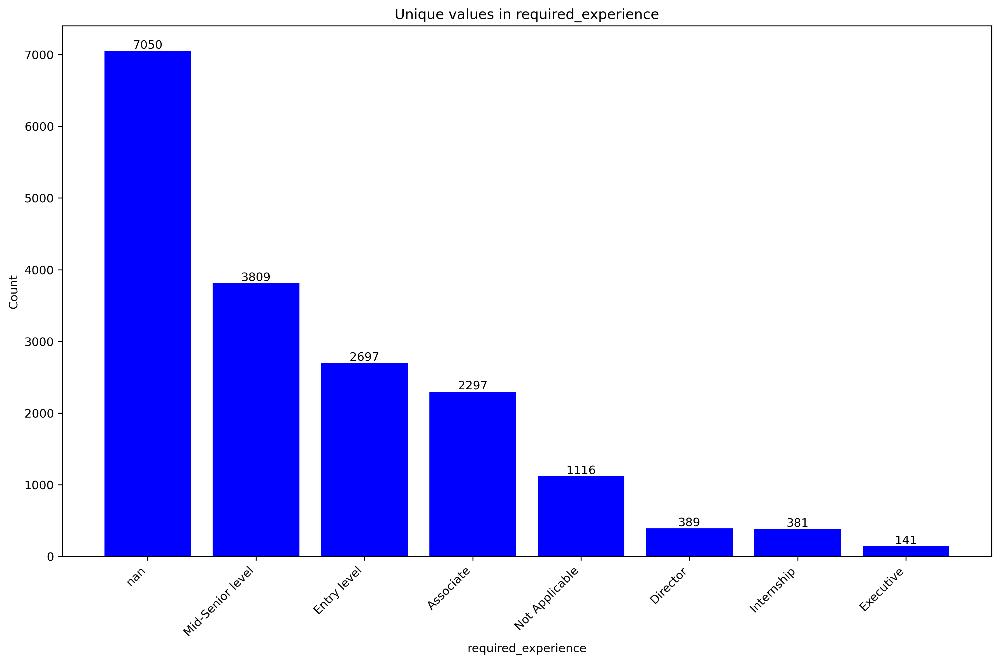

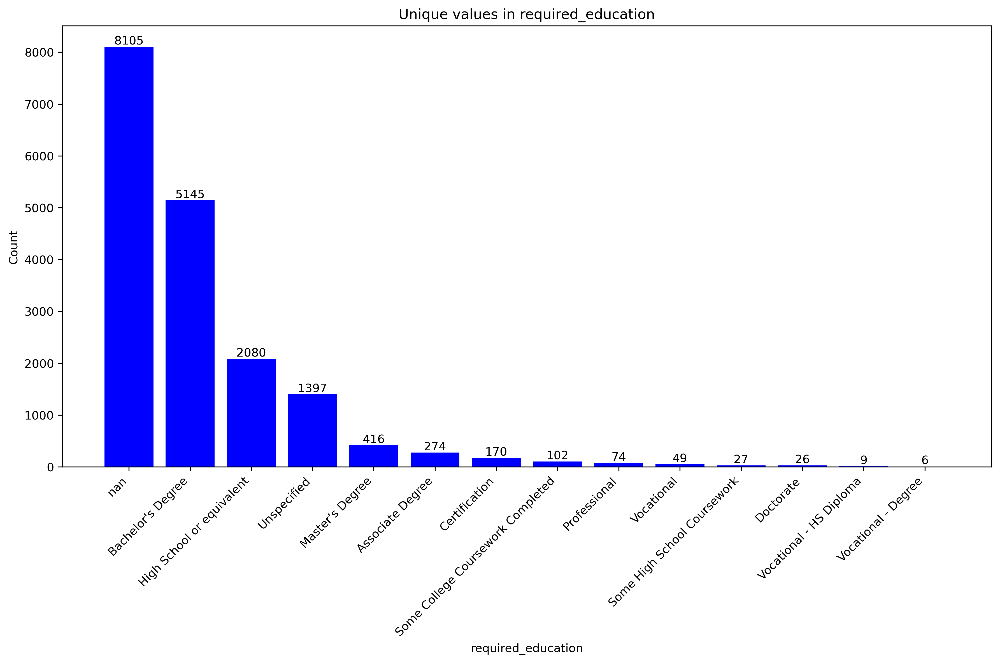

In [29]:
# List the categorical features
categorical_columns = ['employment_type', 'required_experience', 'required_education']

# Call the function to plot unique values
plot_unique_values_and_counts(df_job, categorical_columns)

We chose to plot fraudulent rates per category, as this reflects the true extent of fraudulence relative to the category size.


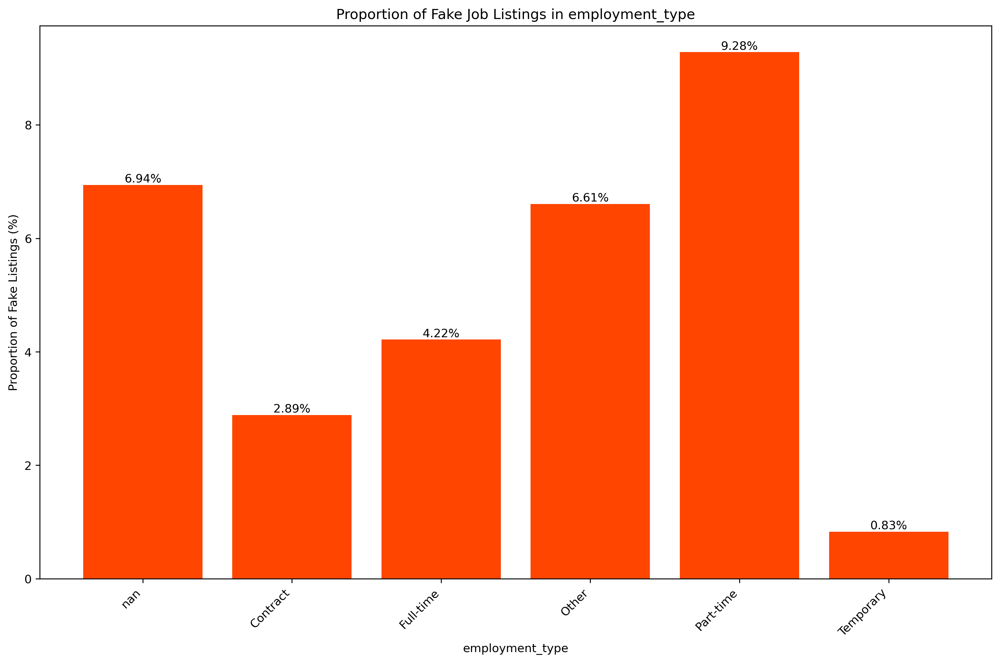

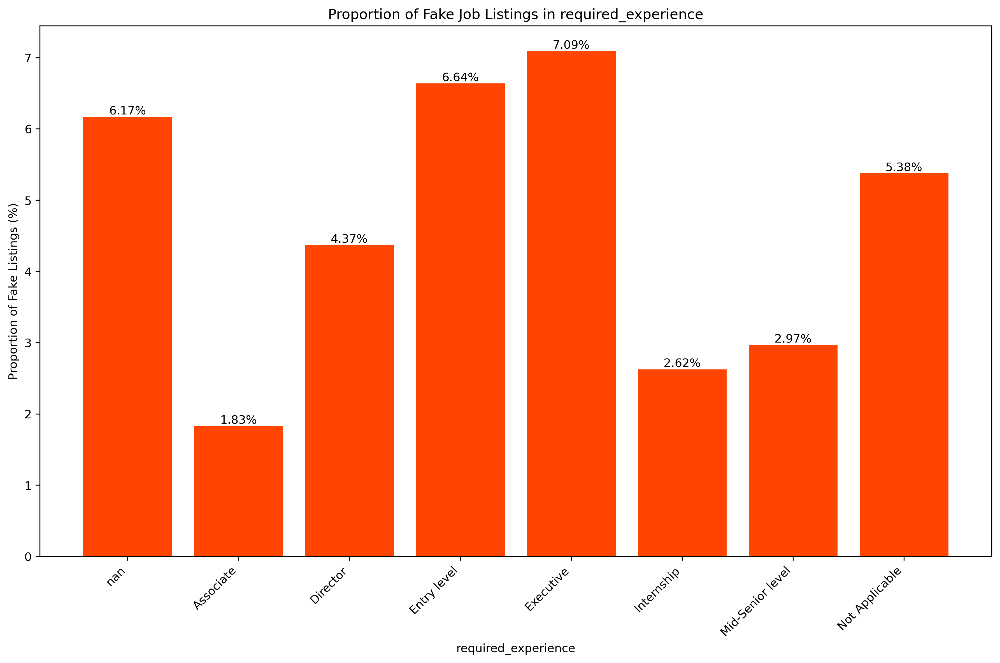

2023-12-11 20:07:17,121 : WARNING : posx and posy should be finite values
2023-12-11 20:07:17,122 : WARNING : posx and posy should be finite values
2023-12-11 20:07:17,123 : WARNING : posx and posy should be finite values
2023-12-11 20:07:17,278 : WARNING : posx and posy should be finite values
2023-12-11 20:07:17,279 : WARNING : posx and posy should be finite values
2023-12-11 20:07:17,280 : WARNING : posx and posy should be finite values


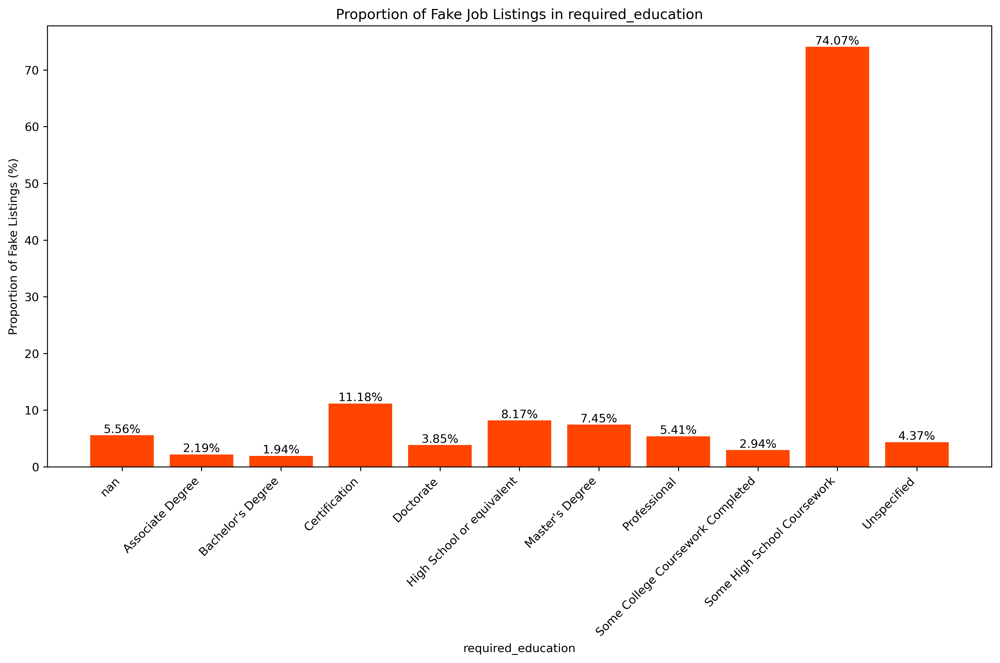

In [31]:
# print transition sentence 
print("We chose to plot fraudulent rates per category, as this reflects the true extent of fraudulence relative to the category size.")

# Call the function to plot proportion of fake job listings in each value
plot_proportion_of_fake_job_listings(df, categorical_columns)


We'll revisit the industry variable later. For now, focusing on other categories, part-time jobs have the highest fraud rate at 9.28%, significantly more than full-time roles. In education, ignoring the skewed "Some High School Coursework," "Certification" has the highest fraud rate at 11.18% while "Bachelor’s Degree" jobs are least likely to be fake at 1.94%. 

<a id="B2.5"></a>
### Binary variables

In [32]:
def plot_binary_variable_counts(df, binary_variable_column, filter_value=1, ax=None):
    """
    Create a bar chart showing the count of real and fraudulent jobs for a binary variable.

    Parameters:
        df (DataFrame): The DataFrame containing the job data.
        binary_variable_column (str): The name of the binary variable column to analyze.
        filter_value (int, optional): The value to filter on (1 or 0, default is 1).
        ax (matplotlib axes, optional): The axes on which to draw the plot. If None, uses current axes.

    Returns:
        None
    """
    filtered_job = df[df[binary_variable_column] == filter_value]
    fraudulent_counts = filtered_job['fraudulent'].value_counts()

    # If an axis is provided, use it; otherwise, use the current axis
    if ax is None:
        ax = plt.gca()
    
    ax.bar(fraudulent_counts.index, fraudulent_counts.values, color=['skyblue', 'orangered'])
    ax.set_xticks(fraudulent_counts.index)
    ax.set_xticklabels(['Real Job', 'Fraudulent Job'])
    ax.set_xlabel('Real or Fake')
    ax.set_ylabel('Count')
    ax.set_title(f'Number of Real and Fraudulent Jobs with {binary_variable_column.capitalize()} ({filter_value})')
    
    # Add values to the bars and adjust the y-limit to provide more space
    max_height = max(fraudulent_counts.values)
    ax.set_ylim(0, max_height * 1.1)
    # Add values to the bars
    for i, count in enumerate(fraudulent_counts.values):
        ax.text(i, count, str(count), ha='center', va='bottom')

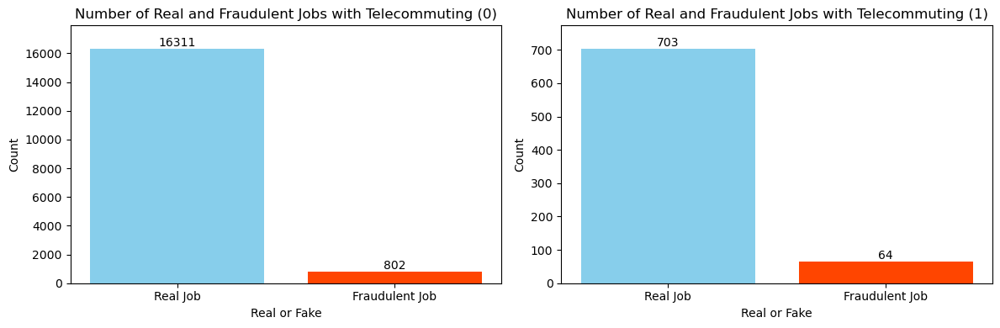

In [33]:
# Place the bar charts side by side
fig, axs = plt.subplots(1, 2, figsize=(12, 4)) 

# Use the first axis (axs[0]) for the first plot where [binary_variable_column] == 0
plot_binary_variable_counts(df_job, 'telecommuting', filter_value=0, ax=axs[0])

# Use the second axis (axs[1]) for the second plot where [binary_variable_column] == 1 (default behavior)
plot_binary_variable_counts(df_job, 'telecommuting', ax=axs[1])

plt.tight_layout()
plt.show()

In [35]:
# As the number of telecommuting job and non-telecommuting job differ greatly, 
# we calculated each of their proportion to find out more information.

def plot_binary_variable_proportion(df, binary_variable_column):
    """
    Create a bar chart showing the proportion of fraudulent jobs for a binary variable.

    Parameters:
        df (DataFrame): The DataFrame containing the job data.
        binary_variable_column (str): The name of the binary variable column to analyze.

    Returns:
        None
    """
    # Filter the DataFrame for the binary variable being 1
    df_1 = df[df[binary_variable_column] == 1]

    # Calculate the proportion of fraudulent jobs when the binary variable is 1
    proportion_1 = (df_1["fraudulent"] == 1).mean()

    # Filter the DataFrame for the binary variable being 0
    df_0 = df[df[binary_variable_column] == 0]

    # Calculate the proportion of fraudulent jobs when the binary variable is 0
    proportion_0 = (df_0["fraudulent"] == 1).mean()

    # Create bar chart
    fig, ax = plt.subplots(figsize=(6, 4), dpi=150) # can add dpi = 120
    bars = ax.bar([f'{binary_variable_column.capitalize()} = 1', f'{binary_variable_column.capitalize()} = 0'],
                  [proportion_1, proportion_0], color="orangered")
    ax.set_xlabel(binary_variable_column.capitalize())
    ax.set_ylabel("Proportion of Fraudulent Jobs")

    # Convert y-axis to percentage
    ax.yaxis.set_major_formatter(PercentFormatter(1.0))

    # Adjust the y-limit of the chart to provide more space for labels
    y_lim = max(proportion_1, proportion_0) * 1.2
    ax.set_ylim([0, y_lim])

    # Add labels on top of bars
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.1%}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

    plt.title(f"Proportion of Fraudulent Jobs by {binary_variable_column.capitalize()}")
    plt.show()

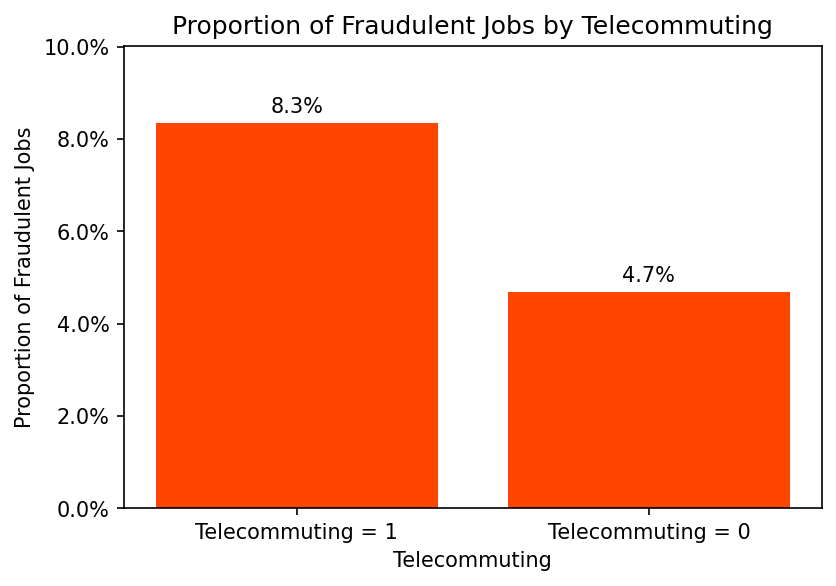

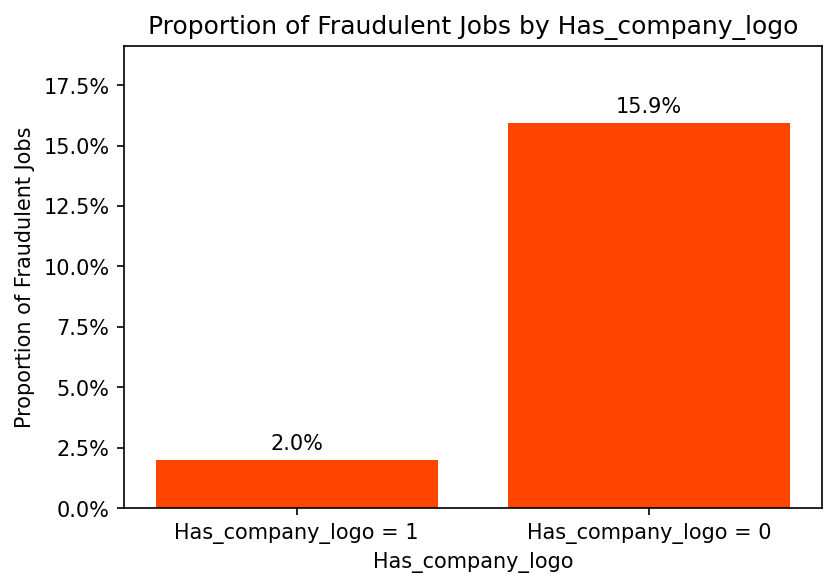

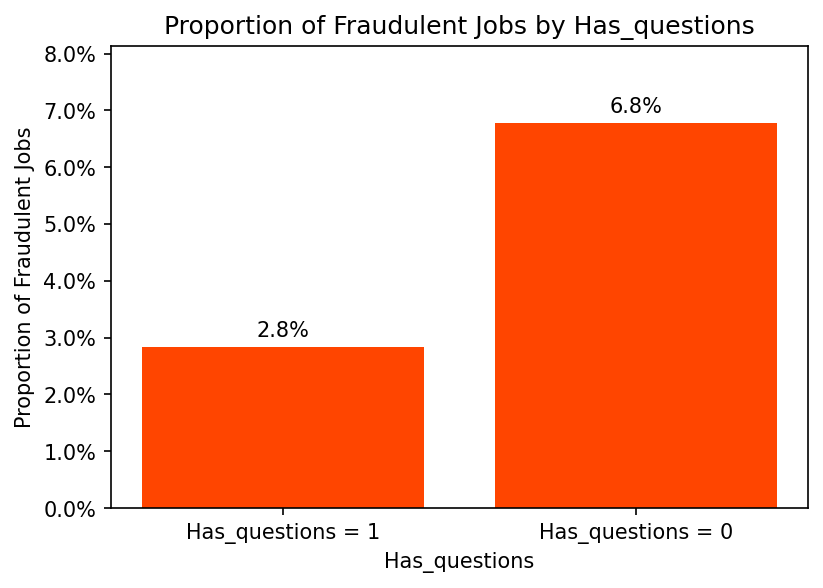

In [37]:
# Visualize the proportion of fraudulent jobs for the 'telecommuting' binary variable
plot_binary_variable_proportion(df_job, "telecommuting")

# Print a line space
print("\n")

# Visualize the proportion of fraudulent jobs for the 'has_company_logo' binary variable
plot_binary_variable_proportion(df_job, "has_company_logo")

# Print a line space
print("\n")

# Visualize the proportion of fraudulent jobs for the 'has_questions' binary variable
plot_binary_variable_proportion(df_job, "has_questions")

The bar chart reveals that telecommuting jobs have a higher fraud rate (8.3%) compared to non-telecommuting (4.7%), likely because scammers can more easily obscure their location. Posts with a company logo have a lower fraud rate (2.0%) than those without (15.9%), aligning with our correlation matrix results. Additionally, jobs lacking screening questions are more likely to be fraudulent, as scammers typically seek quick access to potential victims and avoid creating screening questions.

### Manually solve the problem

Our analysis thus far suggests two primary indicators for manually identifying fraudulent job postings:

1. Posts lacking a company logo.
2. Postings with limited character counts, particularly in company profiles. Conversely, we would view postings with more extensive character counts, like those exceeding 500 characters in company profiles or 1500 in job requirements, as more likely to be authentic.


<a id="C"></a>

# C: Prepare the data 

<a id="C1"></a>
## C1: Data cleaning - dealing with missing values

In [79]:
# Create a copy of the DataFrame to preserve the original data and avoid unintended modifications
df_job_clean = df_job.copy()
# df_job_clean.head(1)

In [80]:
# Based on the table of column names and percent of missing values 
# Drop salary_range as there are 84% missing values 
# Create a function like this so that we can easily drop other columns as we go on 

def drop_column(df, column_name):
    """
    Drop a column from a DataFrame and return the updated DataFrame.

    Parameters:
    - df (DataFrame): The DataFrame to modify.
    - column_name (str): The name of the column to drop.

    Returns:
    - DataFrame: The updated DataFrame with the specified column removed.
    """
    if column_name in df.columns:
        df = df.drop(column_name, axis=1)
    else:
        print(f"Column '{column_name}' not found in the DataFrame.")

    return df

From seeing the percentage of data missing in each column, it seems that there is quite a few features that have a lot of missing rows. As such, we will delete the various columns:

1. job_id because the DataFrame already has a built in index.
2. salary_range because around 84% of the data is missing
3. department because around 65% of the data is missing

The rest of the columns will deal with missing values in a methedolical order.

In [81]:
df_job_clean = drop_column(df_job_clean, 'job_id')
df_job_clean = drop_column(df_job_clean, 'salary_range')
df_job_clean = drop_column(df_job_clean, 'department')
# df_job_clean.head(1)

To address missing data in categorical variables, informed by distribution patterns from our visualisations, we use these methods:

1. **Employment Type (19.4% missing)**: 
   - Impute using the mode, 'Full Time', to reflect the predominant category and minimise data distortion.


2. **Required Experience (39.4% missing), Required Education (45.3% missing), Function (36.1% missing)**:
   - Impute with 'Not Specified', acknowledging the absence of information without making misleading assumptions. This preserves data distribution and highlights potential fraud indicators, as missing values could be associated with fraudulent listings. 


3. **Industry (27.4% missing)**:
   - Cluster similar industries, then impute missing values with the most common industry within each cluster. 


In [82]:
# Handling the missing values as per the recommendations above

# For employment_type, we will impute with the most frequent value (mode)
# This occurs much more frequently than any other category in employment_type
df_job_clean['employment_type'].fillna(df_job_clean['employment_type'].mode()[0], inplace=True)

# For required_experience and required_education, add a 'Not Specified' category
df_job_clean['required_experience'].fillna('Not Specified', inplace=True)
df_job_clean['required_education'].fillna('Not Specified', inplace=True)

# Since industry requires a bit more sophisticated handling (clustering similar industries),
# we will first fill the missing values with 'Unknown' to maintain data integrity
# and later perform clustering to group similar industries together.
imputer = SimpleImputer(strategy='constant', fill_value='Unknown')
df_job_clean['industry'] = imputer.fit_transform(df_job_clean[['industry']])

# For function, we also add a 'Not Specified' category
df_job_clean['function'].fillna('Not Specified', inplace=True)


# List the categorical features
categorical_columns = ['employment_type', 'required_experience', 'required_education', 'industry', 'function']

# Let's now check the new missing percentage values for each categorical variable using the designed function 
missing_info_df = missing_values_info(df_job_clean, categorical_columns)
missing_info_df

,Column Title,Missing Percentage
0,employment_type,0.0
1,required_experience,0.0
2,required_education,0.0
3,industry,0.0
4,function,0.0


#### Dealing with missing values using clustering 

In [42]:
# Determine the optimal number of clusters by evaluating it under multiple methods 

# Set a random seed for reproducibility
costs = []
for num_clusters in range(1, 16):  
    km = KModes(n_clusters=num_clusters, init='Huang', n_init=5, verbose=1, random_state=44)
    km.fit(df_job_clean[['industry']])
    costs.append(km.cost_)


def calculate_scores(scoring_function):
    """
    Calculate clustering evaluation scores for different numbers of clusters using KModes.

    Parameters:
    - scoring_function (callable): A clustering evaluation scoring function that takes true labels and predicted labels as input.

    Returns:
    - list: A list of scores for each number of clusters tested (from 2 to 10).
    """
    scores = []
    K = range(2, 16)
    encoder = LabelEncoder()
    encoded_industry_data = encoder.fit_transform(df_job_clean['industry'].astype(str).values)

    for k in K:
        km = KModes(n_clusters=k, init='Huang', n_init=5, verbose=1, random_state=44)
        labels = km.fit_predict(df_job_clean[['industry']]) 
        score = scoring_function(encoded_industry_data.reshape(-1, 1), labels)
        scores.append(score)

    return scores

silhouette_scores = calculate_scores(silhouette_score)
davies_bouldin_scores = calculate_scores(davies_bouldin_score)
calinski_scores = calculate_scores(calinski_harabasz_score)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 12977.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 12977.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 12977.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 12977.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 12977.0
Best run was number 1


KModes(init='Huang', n_clusters=1, n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 12850.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 12149.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 11243.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 11601.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 12149.0
Best run was number 3


KModes(init='Huang', n_clusters=2, n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 12721.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 10415.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 12026.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 11474.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 12020.0
Best run was number 2


KModes(init='Huang', n_clusters=3, n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 10987.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 11862.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 10292.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 9740.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 10891.0
Best run was number 4


KModes(init='Huang', n_clusters=4, n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 11436.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 11639.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 9230.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 9582.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 10063.0
Best run was number 3


KModes(init='Huang', n_clusters=5, n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 9702.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 11566.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 9222.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 9563.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 8687.0
Best run was number 5


KModes(init='Huang', n_clusters=6, n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 8326.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 9832.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 10594.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 9519.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 7625.0
Best run was number 5


KModes(init='Huang', n_clusters=7, n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 8752.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 11480.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 10516.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 10600.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 7267.0
Best run was number 5


KModes(init='Huang', n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 8749.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 9746.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 8782.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 10492.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 6445.0
Best run was number 5


KModes(init='Huang', n_clusters=9, n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 9237.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 9249.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 8285.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 9314.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 7050.0
Best run was number 5


KModes(init='Huang', n_clusters=10, n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 9188.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 9110.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 8127.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 7938.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 6977.0
Best run was number 5


KModes(init='Huang', n_clusters=11, n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 8366.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 8952.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 7904.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 9010.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 6690.0
Best run was number 5


KModes(init='Huang', n_clusters=12, n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 7022.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 8729.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 7777.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 7948.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 7150.0
Best run was number 1


KModes(init='Huang', n_clusters=13, n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 5691.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 7667.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 7977.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 6572.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 7096.0
Best run was number 1


KModes(init='Huang', n_clusters=14, n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 5590.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 6291.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 7198.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 6903.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 6969.0
Best run was number 1


KModes(init='Huang', n_clusters=15, n_init=5, random_state=44, verbose=1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 12850.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 12149.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 11243.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 11601.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 12149.0
Best run was number 3
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 12721.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 10415.0
Init: initializing centroids
Init: initializing clusters
Starting iteration

Text(0.5, 0, 'Number of clusters')

Text(0, 0.5, 'Cost (WCSS)')

Text(0.5, 1.0, 'Elbow Method For Optimal k')

Text(0.5, 0, 'Number of clusters')

Text(0, 0.5, 'Silhouette Score')

Text(0.5, 1.0, 'Silhouette Method For Optimal k')

Text(0.5, 0, 'Number of clusters')

Text(0, 0.5, 'Davies-Bouldin Score')

Text(0.5, 1.0, 'Davies-Bouldin Method For Optimal k')

Text(0.5, 0, 'Number of clusters')

Text(0, 0.5, 'Calinski-Harabasz Score')

Text(0.5, 1.0, 'Calinski-Harabasz Index Method For Optimal k')

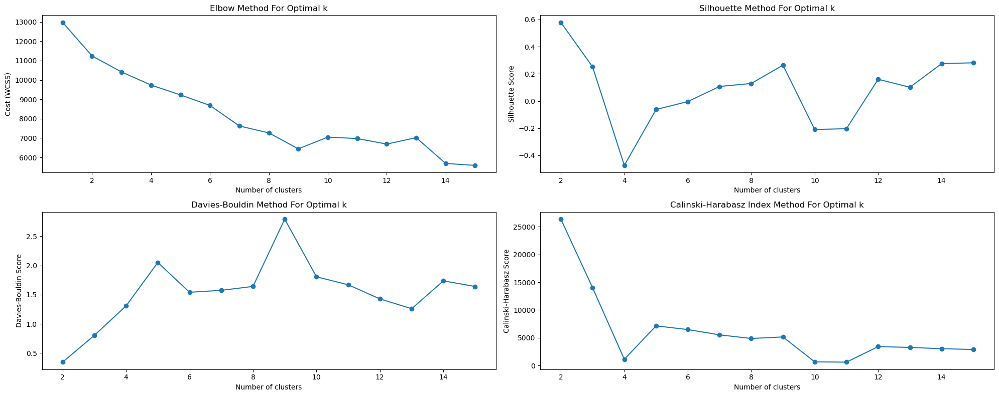

The optimal number of clusters based on Silhouette Score is: 2
The optimal number of clusters based on Davies-Bouldin Index is: 2
The optimal number of clusters is: 2


In [46]:
# Create a figure with multiple subplots 
fig, axes = plt.subplots(2, 2, figsize=(20,8))
K = range(2, 16)

# Plot the cost against the number of clusters to find the elbow
axes[0, 0].plot(range(1, 16), costs, marker='o')
axes[0, 0].set_xlabel('Number of clusters')
axes[0, 0].set_ylabel('Cost (WCSS)')
axes[0, 0].set_title('Elbow Method For Optimal k')

# Plot the silhouette scores
axes[0, 1].plot(K, silhouette_scores, marker='o')
axes[0, 1].set_xlabel('Number of clusters')
axes[0, 1].set_ylabel('Silhouette Score')
axes[0, 1].set_title('Silhouette Method For Optimal k')

# Plot the Davies-Bouldin scores
axes[1, 0].plot(K, davies_bouldin_scores, marker='o')
axes[1, 0].set_xlabel('Number of clusters')
axes[1, 0].set_ylabel('Davies-Bouldin Score')
axes[1, 0].set_title('Davies-Bouldin Method For Optimal k')

# Plot the Calinski-Harabasz scores
axes[1, 1].plot(K, calinski_scores, marker='o')
axes[1, 1].set_xlabel('Number of clusters')
axes[1, 1].set_ylabel('Calinski-Harabasz Score')
axes[1, 1].set_title('Calinski-Harabasz Index Method For Optimal k')

# # Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

# Determine the optimal number of clusters based on the highest silhouette score
optimal_silhouette_k = K[silhouette_scores.index(max(silhouette_scores))]
print(f'The optimal number of clusters based on Silhouette Score is: {optimal_silhouette_k}')

# Determine the optimal number of clusters based on the lowest Davies-Bouldin score
optimal_db_k = K[davies_bouldin_scores.index(min(davies_bouldin_scores))]
print(f'The optimal number of clusters based on Davies-Bouldin Index is: {optimal_db_k}')

# Determine the optimal number of clusters based on the highest Calinski-Harabasz score
optimal_k = K[calinski_scores.index(max(calinski_scores))]
print(f'The optimal number of clusters is: {optimal_k}')


The Silhouette, Davies-Bouldin, and Calinski-Harabasz scores suggest two clusters as optimal, which contradicts our clustering goals. The elbow curve indicates that nine clusters are the optimal choice, a finding corroborated by the Silhouette method. Although Calinski-Harabasz shows decent performance for nine clusters, Davies-Bouldin rates it less favourably. Still, we plan to use nine clusters for industry segmentation, continuously evaluating its effectiveness and alignment with our objectives.

In [83]:
# Finally, impute missing "industry" values based on the mode of the cluster it appears in

# Assign the optimal cluster number to the variable based on the previous analysis
optimal_k = 9

# Apply K-Modes with the optimal number of clusters
km = KModes(n_clusters=optimal_k, init='Huang', n_init=5, verbose=1, random_state=44)
clusters = km.fit_predict(df_job_clean[['industry']])

# Map the clusters to the DataFrame
df_job_clean['industry_cluster'] = clusters

# Explicitly assign 'Unknown' values to a specific cluster (e.g., cluster 0)
df_job_clean.loc[df_job_clean['industry'] == 'Unknown', 'industry_cluster'] = 0

# Find the most common value in each cluster (excluding 'Unknown')
cluster_modes = df_job_clean[df_job_clean['industry'] != 'Unknown'].groupby('industry_cluster')['industry'].agg(lambda x: x.value_counts().idxmax())

# Create a mapping from cluster to mode value
cluster_mode_mapping = cluster_modes.to_dict()

# Replace 'Unknown' values with the mode of the respective cluster's known values
for cluster in range(optimal_k):
    if cluster in cluster_mode_mapping:
        mode_value = cluster_mode_mapping[cluster]
        df_job_clean.loc[(df_job_clean['industry_cluster'] == cluster) & (df_job_clean['industry'] == 'Unknown'), 'industry'] = mode_value

# Print line breaks for easier readability 
print("\n")
print("\n")

# Count the number of 'Unknown' values after imputation
unknown_count = (df_job_clean['industry'] == 'Unknown').sum()
print(f"The value 'Unknown' occurs {unknown_count} times in the 'industry' column.")

# Print the cluster mode mapping dictionary
print("The most common industry in each cluster is: \n", cluster_mode_mapping)

# View the imputed DataFrame
# df_job_clean.head(1)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 8749.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 9746.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 8782.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 10492.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 6445.0
Best run was number 5




The value 'Unknown' occurs 0 times in the 'industry' column.
The most common industry in each cluster is: 
 {0: 'Education Management', 1: 'Design', 2: 'Retail', 3: 'Information Technology and Services', 4: 'Marketing and Advertising', 6: 'Internet', 7: 'Consumer Services', 8: 'Computer Software'}


Unique values: [0 4 8 3 6 7 1 2]


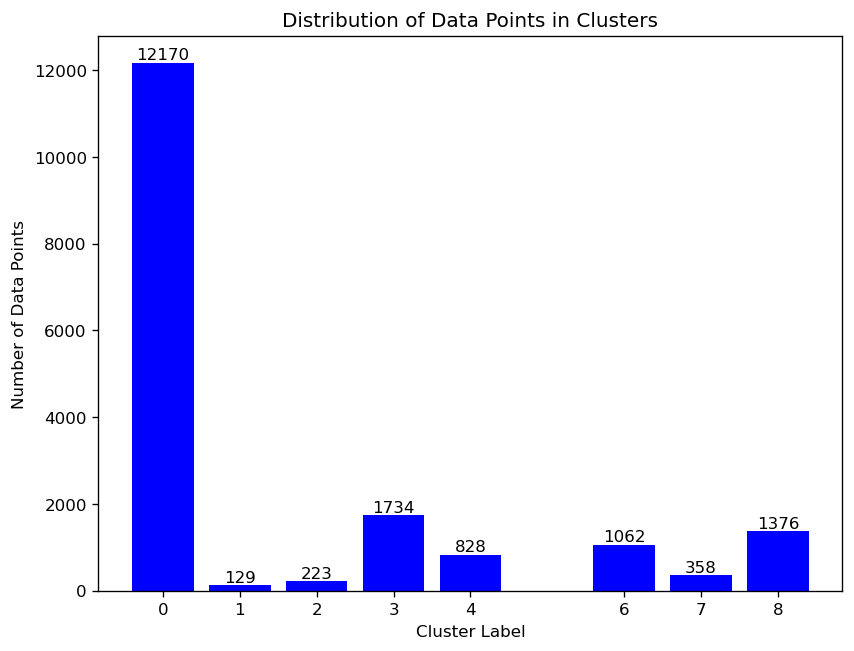

In [84]:
# Let's investigate the distribution of clusters
# Using unique()
unique_values = df_job_clean['industry_cluster'].unique()
print("Unique values:", unique_values)

# Use the value_counts() method to count the number of data points in each cluster
cluster_counts = df_job_clean['industry_cluster'].value_counts()

# Sort the cluster counts by index (cluster labels)
cluster_counts = cluster_counts.sort_index()

# Create a bar plot
plt.figure(figsize=(8, 6), dpi=120)
bars = plt.bar(cluster_counts.index, cluster_counts.values, color='blue')

# Label the x-axis and y-axis
plt.xlabel('Cluster Label')
plt.ylabel('Number of Data Points')

# Set the title of the chart
plt.title('Distribution of Data Points in Clusters')

# Add count values on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, str(height), ha='center', va='bottom')

# Ensure all cluster labels are displayed on the x-axis
plt.xticks(cluster_counts.index)

plt.show();

In [85]:
# Dictionary mapping cluster numbers to their mode industries
cluster_mapping = {
    0: 'Education Management',
    1: 'Design',
    2: 'Retail',
    3: 'Information Technology and Services',
    4: 'Marketing and Advertising',
    6: 'Internet',
    7: 'Consumer Services',
    8: 'Computer Software'
}

# Create a DataFrame from the dictionary
cluster_df = pd.DataFrame(list(cluster_mapping.items()), columns=['Cluster Number', 'Mode Industry in Cluster'])
cluster_df

,Cluster Number,Mode Industry in Cluster
0,0,Education Management
1,1,Design
2,2,Retail
3,3,Information Technology and Services
4,4,Marketing and Advertising
5,6,Internet
6,7,Consumer Services
7,8,Computer Software


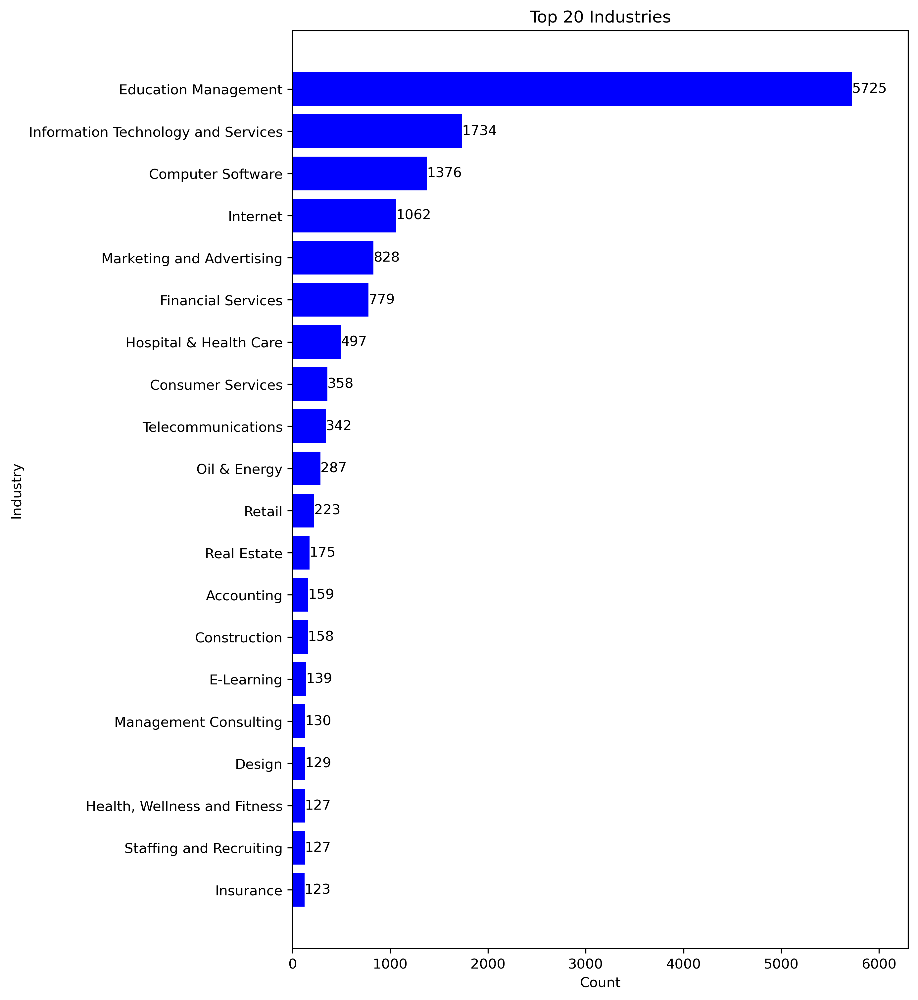

In [86]:
# Let's re-look at the top industry counts to visualise the impact of clustering
plot_top_industries(df_job_clean, top_n=20)

Our analysis indicates that clustering primarily assigned NaN values to the 'Education and Training' category, potentially biassing our model by overrepresentation. Consequently, it's clear that using clustering for imputing missing values wasn't ideal. To rectify this, we'll mark any remaining missing values as "Not Specified." While we initially hoped to use industry clusters for dimensionality reduction in one-hot encoding, we'll now employ GenAI to reclassify industries into 18 broader categories, down from 135. 

In [87]:
# Define a mapping dictionary for the industry categories
industry_mapping = {
    "Health, Wellness and Fitness": "Healthcare and Wellness",
    "Hospital & Health Care": "Healthcare and Wellness",
    "Mental Health Care": "Healthcare and Wellness",
    "Medical Practice": "Healthcare and Wellness",
    "Pharmaceuticals": "Healthcare and Wellness",
    "Medical Devices": "Healthcare and Wellness",
    
    "Computer Software": "Technology and Software",
    "Information Technology and Services": "Technology and Software",
    "E-Learning": "Technology and Software",
    "Electrical/Electronic Manufacturing": "Technology and Software",
    "Computer Networking": "Technology and Software",
    "Computer & Network Security": "Technology and Software",
    "Computer Hardware": "Technology and Software",
    "Computer Games": "Technology and Software",
    
    "Financial Services": "Financial and Professional Services",
    "Banking": "Financial and Professional Services",
    "Insurance": "Financial and Professional Services",
    "Investment Management": "Financial and Professional Services",
    "Investment Banking": "Financial and Professional Services",
    "Accounting": "Financial and Professional Services",
    "Management Consulting": "Financial and Professional Services",
    "Legal Services": "Financial and Professional Services",
    "Law Practice": "Financial and Professional Services",
    
    "Marketing and Advertising": "Marketing, Media, and Communications",
    "Online Media": "Marketing, Media, and Communications",
    "Public Relations and Communications": "Marketing, Media, and Communications",
    "Media Production": "Marketing, Media, and Communications",
    "Publishing": "Marketing, Media, and Communications",
    "Broadcast Media": "Marketing, Media, and Communications",
    "Writing and Editing": "Marketing, Media, and Communications",
    "Graphic Design": "Marketing, Media, and Communications",
    
    "Consumer Services": "Consumer Goods and Services",
    "Consumer Electronics": "Consumer Goods and Services",
    "Cosmetics": "Consumer Goods and Services",
    "Apparel & Fashion": "Consumer Goods and Services",
    "Retail": "Consumer Goods and Services",
    "Restaurants": "Consumer Goods and Services",
    "Consumer Goods": "Consumer Goods and Services",
    "Luxury Goods & Jewelry": "Consumer Goods and Services",
    
    "Construction": "Industrial, Construction, and Engineering",
    "Building Materials": "Industrial, Construction, and Engineering",
    "Machinery": "Industrial, Construction, and Engineering",
    "Mechanical or Industrial Engineering": "Industrial, Construction, and Engineering",
    "Industrial Automation": "Industrial, Construction, and Engineering",
    "Civil Engineering": "Industrial, Construction, and Engineering",
    "Architecture & Planning": "Industrial, Construction, and Engineering",
    
    "Oil & Energy": "Energy and Utilities",
    "Utilities": "Energy and Utilities",
    "Renewable & Environment": "Energy and Utilities",
    
    "Education Management": "Education and Training",
    "Primary/Secondary Education": "Education and Training",
    "Higher Education": "Education and Training",
    "Professional Training & Coaching": "Education and Training",
    
    "Leisure, Travel & Tourism": "Travel, Hospitality, and Leisure",
    "Hospitality": "Travel, Hospitality, and Leisure",
    "Gambling & Casinos": "Travel, Hospitality, and Leisure",
    "Sports": "Travel, Hospitality, and Leisure",
    
    "Music": "Entertainment and Arts",
    "Entertainment": "Entertainment and Arts",
    "Performing Arts": "Entertainment and Arts",
    "Motion Pictures and Film": "Entertainment and Arts",
    "Animation": "Entertainment and Arts",
    
    "Food Production": "Manufacturing and Production",
    "Consumer Electronics": "Manufacturing and Production",
    "Electrical/Electronic Manufacturing": "Manufacturing and Production",
    "Automotive": "Manufacturing and Production",
    "Chemicals": "Manufacturing and Production",
    "Aviation & Aerospace": "Manufacturing and Production",
    "Semiconductors": "Manufacturing and Production",
    "Textiles": "Manufacturing and Production",
    "Furniture": "Manufacturing and Production",
    "Shipbuilding": "Manufacturing and Production",
    "Plastics": "Manufacturing and Production",
    
    "Logistics and Supply Chain": "Transport and Logistics",
    "Transportation/Trucking/Railroad": "Transport and Logistics",
    "Warehousing": "Transport and Logistics",
    "Maritime": "Transport and Logistics",
    "Packaging and Containers": "Transport and Logistics",
    
    "Real Estate": "Real Estate and Construction",
    "Commercial Real Estate": "Real Estate and Construction",
    
    "Farming": "Agriculture and Farming",
    "Ranching": "Agriculture and Farming",
    "Fishery": "Agriculture and Farming",
    
    "Government Administration": "Public Sector and Nonprofits",
    "Nonprofit Organization Management": "Public Sector and Nonprofits",
    "Civic & Social Organization": "Public Sector and Nonprofits",
    "Religious Institutions": "Public Sector and Nonprofits",
    "Public Safety": "Public Sector and Nonprofits",
    "Military": "Public Sector and Nonprofits",
    "Defense & Space": "Public Sector and Nonprofits",
    
    "Research": "Research, Development, and Science",
    "Biotechnology": "Research, Development, and Science",
    "Nanotechnology": "Research, Development, and Science",
    
    "Staffing and Recruiting": "Miscellaneous Services",
    "Human Resources": "Miscellaneous Services",
    "Events Services": "Miscellaneous Services",
    "Facilities Services": "Miscellaneous Services",
    "Environmental Services": "Miscellaneous Services",
    "Security and Investigations": "Miscellaneous Services",
    "Fund-Raising": "Miscellaneous Services",
    "Translation and Localization": "Miscellaneous Services",
    "Photography": "Miscellaneous Services",
    "Veterinary": "Miscellaneous Services",
    "Executive Office": "Miscellaneous Services",
    "Public Policy": "Miscellaneous Services",
    "Museums and Institutions": "Miscellaneous Services",
    "Alternative Dispute Resolution": "Miscellaneous Services",
    
    "International Trade and Development": "Trade and Development",
    "Import and Export": "Trade and Development",
    "Wholesale": "Trade and Development"
}

# Use the map function to apply the mapping to the "industry" column
df_job_clean["industry"] = df_job_clean["industry"].map(industry_mapping)

# Let's impute missing values by adding a 'Not Specified' category
df_job_clean['industry'].fillna('Not Specified', inplace=True)

# Drop the industry cluster column 
df_job_clean = drop_column(df_job_clean, "industry_cluster")

# Print the first few rows of the updated DataFrame
# df_job_clean.head(1)


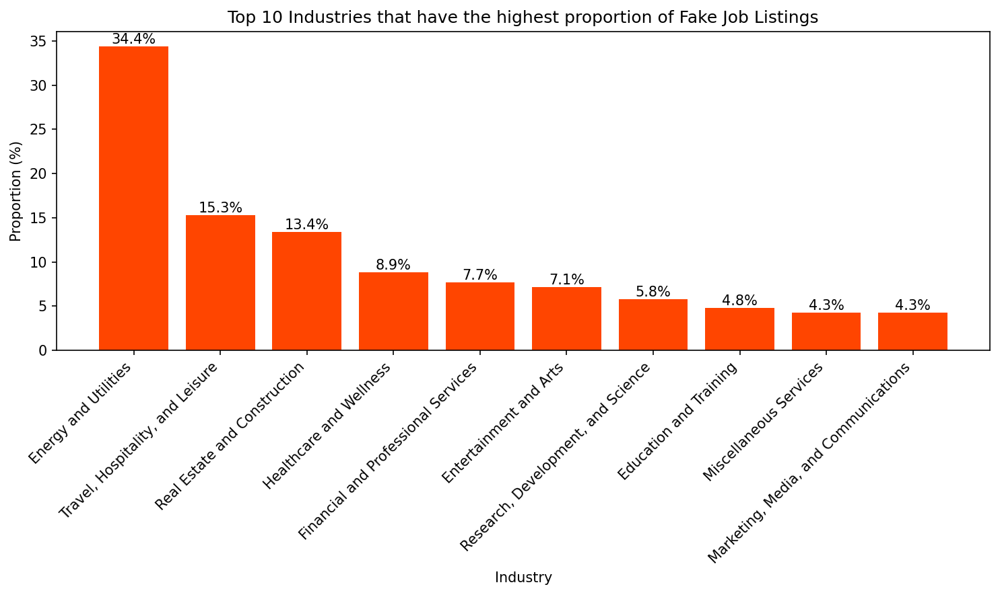

In [88]:
# Now that we have changes the categories within our industry column, we can see patterns based on our transformed industry variable
# Let's visualise the top 10 industries with the highest fraudulence rates 
def plot_top_10_industries_highest_proportion_fraudulent(df_job):
    """
    Plots the top 10 industries with the highest proportion of fraudulent job listings.
    
    Parameters:
    df_job (DataFrame): A DataFrame containing job listing data with 'industry' and 'fraudulent' columns.
    
    Returns:
    None: This function does not return anything. It generates a bar chart.
    """
    # Calculate the count of job postings for each industry
    industry_counts = df_job['industry'].value_counts()

    # Calculate the count of fraudulent job postings for each industry
    fraudulent_industry_counts = df_job[df_job['fraudulent'] == 1]['industry'].value_counts()

    # Calculate the proportions of fraudulent postings for each industry
    proportion = fraudulent_industry_counts / industry_counts * 100

    # Sort the proportions in descending order and select the top 10 industries with the highest proportion of fake posts
    top_10_proportion = proportion.sort_values(ascending=False).head(10)

    # Create a vertical bar chart for the top 10 industries by proportion of fake posts
    plt.figure(figsize=(10, 6), dpi=150)  # Define the size of the figure
    plt.bar(top_10_proportion.index, top_10_proportion.values, color='orangered')  # Create the bars in orange-red color

    # Label the y-axis and x-axis
    plt.ylabel("Proportion (%)")
    plt.xlabel("Industry")

    # Set the title of the chart
    plt.title("Top 10 Industries that have the highest proportion of Fake Job Listings")

    # Annotate the proportion on top of each bar
    for index, value in enumerate(top_10_proportion.values):
        plt.text(index, value, f'{value:.1f}%', ha='center', va='bottom', fontsize=10, color='black')

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')

    # Adjust the layout
    plt.tight_layout()

    # Display the chart
    plt.show()

# Plot the proportion of fraudulent job postings in the top 10 industries.
plot_top_10_industries_highest_proportion_fraudulent(df_job_clean)

Post-adjustment, the plots show "Energy and Utilities" with the highest proportion of fake job postings at 34.4%. The "Travel, Hospitality, and Leisure" sector follows with a 15.3% fraud rate. Interestingly, sectors like "Real Estate and Construction" and "Healthcare and Wellness" also show notable proportions of fraudulent listings at 13.4% and 8.9%, respectively. 

In [89]:
# We want to keep the fraudulent variable at the end
# As we transform other variables, it will be useful to have a function that can easily put fraudulent back at the end 

def move_column_to_end(dataframe, column_name):
    """
    Moves a specified column to the end of a DataFrame.

    Parameters:
    dataframe (pd.DataFrame): The input DataFrame.
    column_name (str): The name of the column to be moved to the end.

    Returns:
    pd.DataFrame: The DataFrame with the specified column moved to the end.
    """
    if column_name in dataframe.columns:
        # Get the list of columns in the desired order
        column_order = [col for col in dataframe.columns if col != column_name] + [column_name]
    
        # Reorder the columns
        dataframe = dataframe[column_order]
    
    return dataframe

In [90]:
# Ensure that the target variable is positioned at the end again 
df_job_clean = move_column_to_end(df_job_clean, 'fraudulent')

<a id="C2"></a>
## C2: Data cleaning - location variable transformation

To prepare location data for analysis, we first dissect the 'location' variable into ‘country’, ‘state’, and ‘city’, creating new columns for each. 

In [91]:
# Split the 'location' feature into three new features and expand it into separate columns
split_location = df_job_clean['location'].str.split(', ', expand=True)

# Assign the new columns to the DataFrame
df_job_clean['location_country'] = split_location[0]
df_job_clean['location_state'] = split_location[1]
df_job_clean['location_city'] = split_location[2]

# Handle missing values by replacing empty strings with 'Unknown'
df_job_clean['location_country'].replace('', 'Unknown', inplace=True)
df_job_clean['location_state'].replace('', 'Unknown', inplace=True)
df_job_clean['location_city'].replace('', 'Unknown', inplace=True)

# Just to be sure they aren't any NaN values left 
# For required_experience and required_education, add a 'Not Specified' category
df_job_clean['location_country'].fillna('Unknown', inplace=True)
df_job_clean['location_state'].fillna('Unknown', inplace=True)
df_job_clean['location_city'].fillna('Unknown', inplace=True)

# Drop the original 'location' feature
df_job_clean = drop_column(df_job_clean, 'location')

# Ensure the fraudulent feature is at the end of the df again 
df_job_clean = move_column_to_end(df_job_clean, 'fraudulent')

# View the updated dataframe 
# df_job_clean.head(1)

In [92]:
# Create a copy of df_job_clean at this point
df_location = df_job_clean.copy()

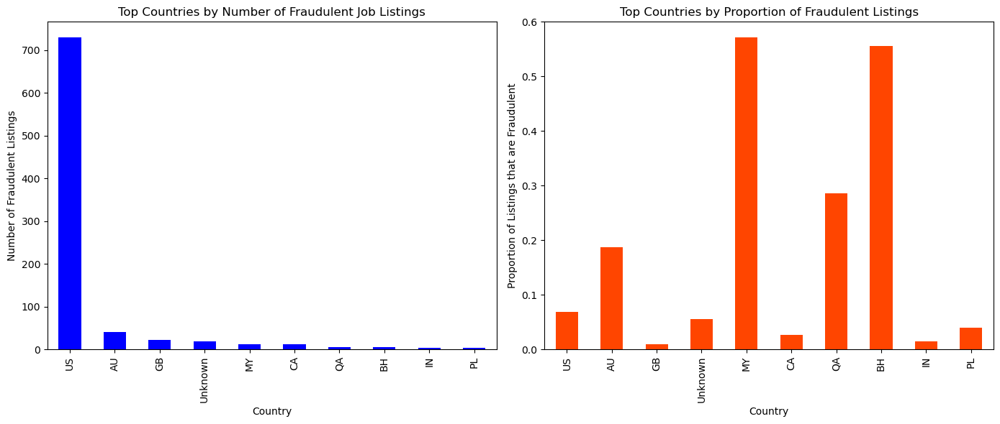

In [93]:
# Calculating the count and proportion of fraudulent listings by country
fraud_country_counts = df_location[df_location['fraudulent'] == 1].groupby('location_country').size()
total_country_counts = df_location.groupby('location_country').size()
fraud_country_proportions = fraud_country_counts / total_country_counts

# Preparing data for visualization
country_fraud_data = pd.DataFrame({
    'Total Listings': total_country_counts, 
    'Fraudulent Listings': fraud_country_counts, 
    'Proportion Fraudulent': fraud_country_proportions
}).fillna(0).sort_values(by='Fraudulent Listings', ascending=False).head(10)

# Visualization
plt.figure(figsize=(14, 6))

# Bar chart for counts
plt.subplot(1, 2, 1)
country_fraud_data['Fraudulent Listings'].plot(kind='bar', color='blue')
plt.title('Top Countries by Number of Fraudulent Job Listings');
plt.ylabel('Number of Fraudulent Listings');
plt.xlabel('Country');

# Bar chart for proportions
plt.subplot(1, 2, 2)
country_fraud_data['Proportion Fraudulent'].plot(kind='bar', color='orangered')
plt.title('Top Countries by Proportion of Fraudulent Listings');
plt.ylabel('Proportion of Listings that are Fraudulent');
plt.xlabel('Country');

plt.tight_layout();
plt.show();

The charts show a clear difference between the number and proportion of fraudulent job listings by country. The U.S. has the highest volume, with over 600 fraudulent postings. Yet, in terms of proportion, Malaysia and Bahrain lead, with over 55% of their job listings being fake, closely followed by Qatar. This suggests that the job listing's location could be a significant predictor in our models.

In [94]:
# Let's explore these location variables more 

# List the location features
location_columns = ['location_country', 'location_state', 'location_city']

# Call the function to explore categorical features
df_unique_location = explore_categorical_features(df_location, location_columns)
df_unique_location

,Column Name,Unique Value Count,Unique Values
0,location_country,91,"[US, NZ, DE, GB, AU, SG, IL, AE, CA, IN, EG, P..."
1,location_state,325,"[NY, Unknown, IA, DC, FL, MD, BE, CA, AZ, NJ, ..."
2,location_city,2339,"[New York, Auckland, Wever, Washington, Fort W..."


Next, we integrate a dataset named "countries" from Google's developer database (Google Developers, 2012) for matching country codes with their longitude and latitude coordinates, transforming location variables from non-numeric to numeric form.

In [95]:
# Load the countries data
countries_data = pd.read_csv("countries.csv")

# Assuming countries_data has columns 'country' for country codes, 'latitude', and 'longitude'

# Convert countries_data into a dictionary for easy lookup
countries_dict = countries_data.set_index('country').to_dict(orient='index')

# Function to fetch latitude and longitude
def get_lat_long(country_code):
    if country_code in countries_dict:
        return countries_dict[country_code]['latitude'], countries_dict[country_code]['longitude']
    else:
        return None, None

# Map latitude and longitude to df_job_clean
df_location['country_latitude'], df_location['country_longitude'] = zip(*df_location['location_country'].map(get_lat_long))

# Check the first row to see it has worked 
# df_location.head(1)

# Check for missing values 
# print("\n")
print("Check for missing values after the transformation into longitude and latitude columns:")
location_cols = ['country_latitude', 'country_longitude']
missing_values_info(df_location, location_cols)



Check for missing values after the transformation into longitude and latitude columns:


,Column Title,Missing Percentage
0,country_latitude,1.9
1,country_longitude,1.9


For the 1.9% of missing location data, we impute missing latitude and longitude values using centroid points, offering a central, unbiased estimate for missing locations, preserving the dataset's geographical integrity for more balanced modelling.

In [96]:
# Make sure to filter out any invalid or missing values first
valid_locations = df_location.dropna(subset=['country_latitude', 'country_longitude'])

# Calculate the centroid
centroid_latitude = valid_locations['country_latitude'].mean()
centroid_longitude = valid_locations['country_longitude'].mean()

# This acts as an indicator variable 
print("The centroids are:")
print("Centroid Latitude:", centroid_latitude, ", Centroid Longitude:", centroid_longitude)

# Impute missing values with the centroid coordinates
df_location['country_latitude'].fillna(centroid_latitude, inplace=True)
df_location['country_longitude'].fillna(centroid_longitude, inplace=True)

# Check there are no missing values 
print("\n")
print("Check missing values have been dealt with:")
missing_values_info(df_location, location_cols)

# Now let's drop the location variables as when we train our models, we only want numeric data
df_location = drop_column(df_location, 'location_country')
df_location = drop_column(df_location, 'location_state')
df_location = drop_column(df_location, 'location_city')

# Ensure that the target variable is positioned at the end again 
df_location = move_column_to_end(df_location, 'fraudulent')

The centroids are:
Centroid Latitude: 37.71740210955857 , Centroid Longitude: -50.07893969487852


Check missing values have been dealt with:


,Column Title,Missing Percentage
0,country_latitude,0.0
1,country_longitude,0.0


<a id="C3"></a>
## C3: Data cleaning - outliers

We've chosen not to address outliers in our project for these reasons:

 **Challenges Due to Data Nature**: 
* Binary, categorical and text features in our dataset complicate traditional outlier detection.
* Binary features lack a continuous range for spotting outliers, while categorical data’s distinct categories don't fit the usual numeric-based outlier definition.


 **Intentional Inclusion for Fraud Detection Model**: 
* In fraud detection, every data point, including anomalies or missing values, can uncover fraud patterns (Singh & Upadhyaya, 2012). Therefore, we aim to keep all data to boost our classification model's accuracy.


<a id="C4"></a>
## C4: Data cleaning - text preprocessing

<a id="C4.1"></a>
### Text cleaning

In [97]:
# Let's make a copy of the dataframe so far 
df_job_2 = df_location.copy()
# df_job_2.head(1)

In [98]:
# Let's combine all the text columns into one 

# Ensure all empty values are empty strings 
df_job_2 = df_job_2.replace(np.nan, '', regex=True)

# Create a text column
df_job_2['text'] = df_job_2[['title','company_profile','description','requirements','benefits']].apply(lambda x: ' '.join(x), axis = 1)

# Drop the columns that were in the text column 
df_job_2.drop(['title','company_profile','description','requirements','benefits'], axis=1, inplace=True)

# Ensure fraudulent column is at the end 
df_job_2 = move_column_to_end(df_job_2, 'fraudulent')

# Print outcome so far 
# df_job_2.head(1)

In [99]:
# Function to check various text properties and create a summary DataFrame
def check_text_properties(df, column_name):
    # Check for URLs
    # Function to check for URLs
    def has_urls(text):
        url_pattern = r'https?://\S+|www\.\S+'
        return bool(re.search(url_pattern, text))

    # Check for URLs and create a 'URLs' column
    # df['URLs'] = df[column_name].apply(has_urls)

    
    # Function to check for emojis
    def has_emojis(text):
        emoji_pattern = re.compile("["
            u"\U0001F600-\U0001F64F"  # emoticons
            u"\U0001F300-\U0001F5FF"  # symbols & pictographs
            u"\U0001F680-\U0001F6FF"  # transport & map symbols
            u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
            u"\U00002702-\U000027B0"
            u"\U000024C2-\U0001F251"
            "]+", flags=re.UNICODE)
        return bool(emoji_pattern.search(text))

    # Check for emojis and create an 'Emojis' column
    # df['Emojis'] = df[column_name].apply(has_emojis)

    
    
    # Function to check for HTML tags
    def has_html_tags(text):
        return bool(re.search(r'<.*?>', text))

    # Check for HTML tags and create an 'HTML Tags' column
    # df['HTML Tags'] = df[column_name].apply(has_html_tags)

    
    
    # Function to check for punctuation
    def has_punctuation(text):
        return any(char in string.punctuation for char in text)

    # Check for punctuation and create a 'Punctuation' column
    # df['Punctuation'] = df[column_name].apply(has_punctuation)

    
   
        # Function to check for common contractions
    def has_contractions(text):
        contractions = {
            "ain't", "aren't", "can't", "could've", "couldn't", "didn't", "doesn't", "don't",
            "hadn't", "hasn't", "haven't", "he'd", "he'll", "he's", "how'd", "how'll", "how's",
            "I'd", "I'll", "I'm", "I've", "isn't", "it's", "let's", "ma'am", "mightn't",
            "mustn't", "needn't", "shan't", "she'd", "she'll", "she's", "shouldn't", "that's",
            "there's", "they'd", "they'll", "they're", "they've", "wasn't", "we'd", "we'll",
            "we're", "we've", "weren't", "what'll", "what're", "what's", "what've", "where's",
            "who'd", "who'll", "who's", "who've", "won't", "would've", "wouldn't", "you'd",
            "you'll", "you're", "you've"
        }
        words = set(text.split())
        return any(word in contractions for word in words)

    # Check for contractions and create a 'Contractions' column
    # df['Contractions'] = df[column_name].apply(has_contractions)
    
    
    
    # Function to check for capital letters
    def has_capital_letters(text):
        return any(char.isupper() for char in text)

    # Check for capital letters and create a 'Capital Letters' column
    # df['Capital Letters'] = df[column_name].apply(has_capital_letters)

    # Apply each function to the specified column and create a summary DataFrame
    summary_df = pd.DataFrame({
        'Emojis': df[column_name].apply(has_emojis).sum(),
        'URLs': df[column_name].apply(has_urls).sum(),
        'HTML Tags': df[column_name].apply(has_html_tags).sum(),
        'Punctuation': df[column_name].apply(has_punctuation).sum(),
        'Contractions': df[column_name].apply(has_contractions).sum(),
        'Capital Letters': df[column_name].apply(has_capital_letters).sum()
    }, index=[column_name])

    return summary_df

In [100]:
# Let's run this function to see what we need to remove 
check_text_properties(df_job_2, 'text')

,Emojis,URLs,HTML Tags,Punctuation,Contractions,Capital Letters
text,152,150,0,17869,3078,17879


In [101]:
# Load the stopwords list and initialize stemmer once to improve efficiency
stop_words = set(stopwords.words('english'))
ps = PorterStemmer()

def final_preprocess(text, stop_words=stop_words, stemmer=ps):
    text = text.lower()
    text = re.sub(r'https?://\S+|www\.\S+', '', text)  # Remove URLs
    text = re.sub(
        r'['
        u'\U0001F600-\U0001F64F'  # emoticons
        u'\U0001F300-\U0001F5FF'  # symbols & pictographs
        u'\U0001F680-\U0001F6FF'  # transport & map symbols
        u'\U0001F1E0-\U0001F1FF'  # flags (iOS)
        u'\U00002702-\U000027B0'
        u'\U000024C2-\U0001F251'
        ']+', 
        '', 
        text, 
        flags=re.UNICODE
    )  # Remove emojis
    text = text.translate(str.maketrans('', '', string.punctuation))  # Remove punctuation
    text = re.sub(r'\b\w{1,3}\b', '', text)  # Remove words with 3 or less characters
    text = ' '.join(word for word in text.split() if word not in stop_words)  # Remove stopwords
    text = ' '.join(stemmer.stem(word) for word in text.split())  # Apply stemming
    return text

# Apply the cleaning function to the dataframe
df_job_2['text'] = df_job_2['text'].apply(final_preprocess)

# df_job_2.head(1)


In [102]:
# Let's check that our data clean function was successful
check_text_properties(df_job_2, 'text')

,Emojis,URLs,HTML Tags,Punctuation,Contractions,Capital Letters
text,0,0,0,0,0,0


In [103]:
# Let's create a copy of this going forward 
df_job_3 = df_job_2.copy()

<a id="C4.2"></a>
### Text analysis part II

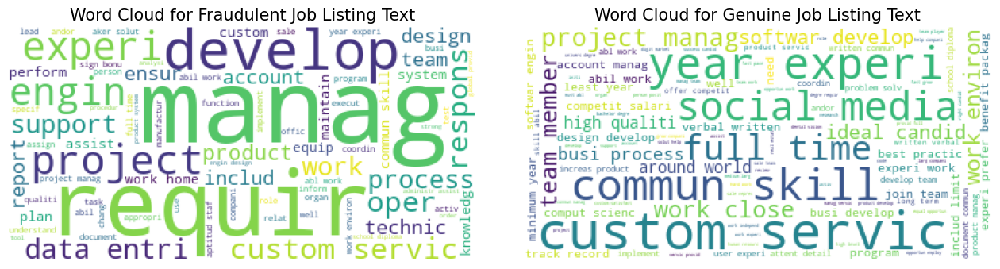

In [104]:
# Generate the first word cloud for fraudulent job listings
text_data_fraudulent = df_job_3[df_job_3['fraudulent'] == 1]['text'].str.cat(sep=' ')
wordcloud_fraudulent = WordCloud(background_color='white', max_words=100).generate(text_data_fraudulent)

# Generate the second word cloud for genuine job listings
text_data_real = df_job_3[df_job_3['fraudulent'] == 0]['text'].str.cat(sep=' ')
wordcloud_real = WordCloud(background_color='white', max_words=100).generate(text_data_real)

# Create a subplot layout with 1 row and 2 columns, with a larger figure size
fig, axs = plt.subplots(1, 2, figsize=(16, 28))  # Increase the width to space out the word clouds

# Display the first word cloud
axs[0].imshow(wordcloud_fraudulent)
axs[0].axis("off")
axs[0].set_title("Word Cloud for Fraudulent Job Listing Text", fontsize=15)

# Display the second word cloud
axs[1].imshow(wordcloud_real)
axs[1].axis("off")
axs[1].set_title("Word Cloud for Genuine Job Listing Text", fontsize=15)

# Adjust layout to reduce space between subplots
plt.subplots_adjust(wspace=0.1)  # Adjust the space width

# Show the plot
plt.show();

# Note: Word clouds are made after stemming is applied, meaning some words may appear truncated or with their ends cut off. 
# This is a text processing step to reduce words to their base or root form.

Common terms in these postings include "manage," "project," and "requirements," pointing to a focus on management and technical roles. Conversely, real job postings often highlight interpersonal skills with words like "customer service," "communication," and "social media."

In [105]:
# It would be interesting to see if there is any difference in common words used per industry 

def plot_wordclouds_for_industry(df, industry_column, industry_value, text_column, max_words=100):
    """
    Creates two word clouds as subplots for fraudulent and genuine job listings for a specified industry,
    with reduced spacing between subplots.

    :param df: pandas DataFrame containing the job data.
    :param industry_column: Column name in DataFrame for the industry.
    :param industry_value: Specific industry value to filter on.
    :param text_column: Column name in DataFrame containing the text data.
    :param max_words: Maximum number of words to include in the word clouds.
    """
    # Filter dataframe for the specified industry
    industry_df = df[df[industry_column] == industry_value]

    # Generate word cloud for fraudulent job listings in the industry
    fraudulent_text = industry_df[industry_df['fraudulent'] == 1][text_column].str.cat(sep=' ')
    wordcloud_fraud = WordCloud(background_color='white', max_words=max_words).generate(fraudulent_text)

    # Generate word cloud for genuine job listings in the industry
    genuine_text = industry_df[industry_df['fraudulent'] == 0][text_column].str.cat(sep=' ')
    wordcloud_real = WordCloud(background_color='white', max_words=max_words).generate(genuine_text)

    # Create subplots with reduced spacing
    fig, axes = plt.subplots(1, 2, figsize=(16, 28), dpi=300)

    # Word Cloud for fraudulent job text in the industry
    axes[0].imshow(wordcloud_fraud)
    axes[0].axis("off")
    axes[0].set_title(f"Word Cloud for Fraudulent Job Listing Text in {industry_value}")

    # Word Cloud for genuine job text in the industry
    axes[1].imshow(wordcloud_real)
    axes[1].axis("off")
    axes[1].set_title(f"Word Cloud for Genuine Job Listing Text in {industry_value}")

    # Adjust layout to reduce space between subplots
    plt.subplots_adjust(hspace=0.01)  # Adjust this value as needed

    plt.show()


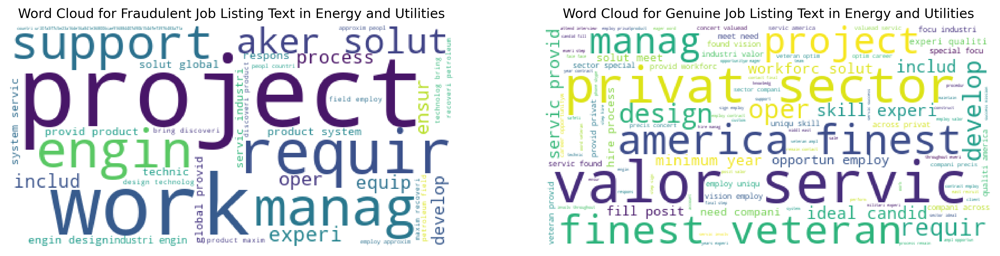

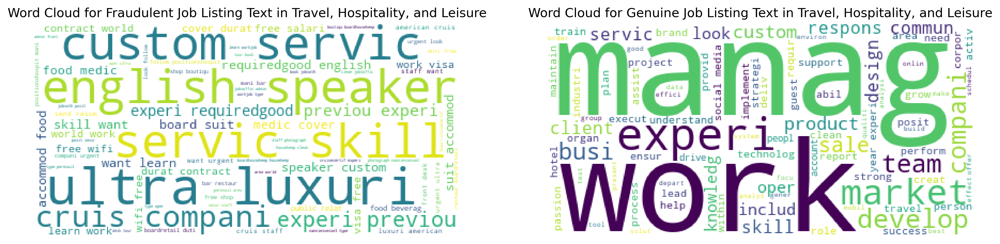

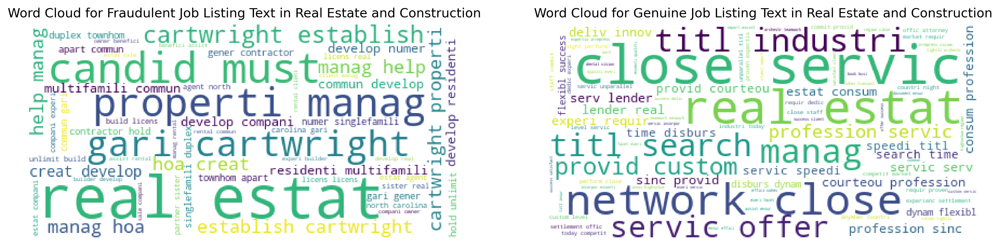

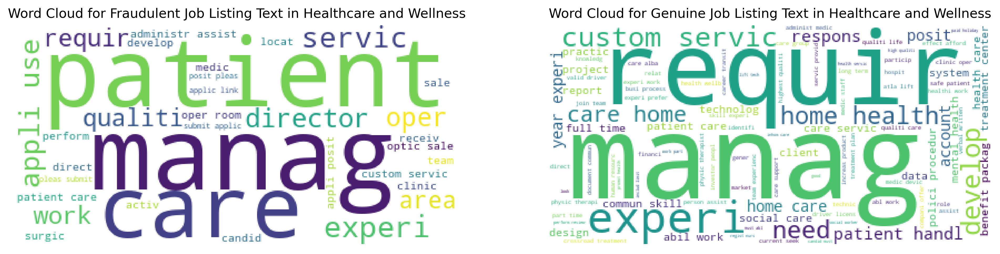

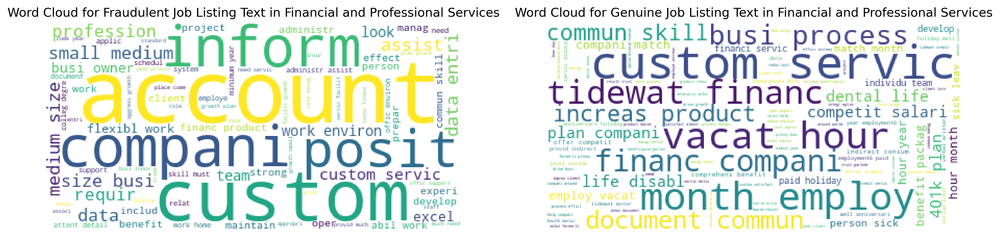

In [106]:
# Calculate the count of job postings for each industry
industry_counts = df_job_3['industry'].value_counts()

# Calculate the count of fraudulent job postings for each industry
fraudulent_industry_counts = df_job_3[df_job_3['fraudulent'] == 1]['industry'].value_counts()

# Calculate the proportions of fraudulent postings for each industry
proportion = fraudulent_industry_counts / industry_counts * 100

# Sort the proportions in descending order and select the top 5 industries with the highest proportion of fake posts
top_5_industries = proportion.sort_values(ascending=False).head(5)

top_5_industries_list = top_5_industries.index.tolist()

for value in top_5_industries_list: 
    plot_wordclouds_for_industry(df_job_3, 'industry', value, 'text')
    print("\n")

Deeper analysis reveals industry-specific language trends: in Energy and Utilities, fraudulent listings frequently use "project" and "manage," imitating important roles, whereas genuine listings emphasise "design" and "development," aligning with actual industry demands. In Travel, fake posts use "luxury" and "cruise" potentially to lure applicants with the promise of glamorous experiences, contrasting with genuine listings that prioritise "experience" and "teamwork," vital for service roles. This suggests scammers imitate industry prestige, while real ads concentrate on specific, essential skills. Additionally, this illustrates how our models might use text to enhance predictions 

<a id="C4.3"></a>
### Word embedding

We transformed the cleaned text into a numerical format through a process called word embedding. This involves tokenizing the text, splitting it into individual words, and then converting each word into a vector (a series of numbers) using Google’s pre-trained model (Harman, 2017; McCormick, 2016). We create a vector for each document (i.e., each row's text data) by averaging the vectors of all the words in that document, creating a format machine learning algorithms can understand and process (Chen, 2020).

In [107]:
# Tokenize the text
df_job_3['tokenized_text'] = df_job_3['text'].apply(lambda x: x.split())

# Function to create a vector for a document by averaging all the word vectors in the document
def document_vector(doc):
    # remove out-of-vocabulary words
    doc = [word for word in doc if word in model.key_to_index]
    if not doc:
        return np.zeros(model.vector_size)
    # use model to get the word vectors and calculate the mean
    return np.mean([model[word] for word in doc], axis=0)

# Apply the function to each document
df_job_3['doc_vector'] = df_job_3['tokenized_text'].apply(document_vector)

In [108]:
# Drop the text columns because they aren't needed in the models 
df_job_3 = drop_column(df_job_3, 'text')
df_job_3 = drop_column(df_job_3, 'tokenized_text')

# Ensure the fraudulent feature is at the end of the df again 
df_job_3 = move_column_to_end(df_job_3, 'fraudulent')

df_job_3.head(1)

,telecommuting,has_company_logo,has_questions,employment_type,required_experience,required_education,industry,function,country_latitude,country_longitude,doc_vector,fraudulent
0,0,1,0,Other,Internship,Not Specified,Education and Training,Marketing,37.09024,-95.712891,"[-0.039133586, 0.013796473, -0.038325354, 0.06...",0


In [106]:
# Export this to a csv file
# df_job_3.to_csv('text_cleaned_job.csv', index=False)

<a id="C5"></a>
## C5: Data cleaning - encode categorical features 

In [119]:
# Create a copy of the DataFrame
# df_job_4 = df_job_3.copy()

# Load dataset 
df_job_4 = pd.read_csv("text_cleaned_job.csv")

In [120]:
# Let's just double check the missing values 
# Run the missing values info function
missing_info_df = missing_values_info(df_job_4, list(df_job_4.columns))
missing_info_df.head(20)

,Column Title,Missing Percentage
0,telecommuting,0.0
1,has_company_logo,0.0
2,has_questions,0.0
3,employment_type,0.0
4,required_experience,0.0
5,required_education,0.0
6,industry,0.0
7,function,0.0
8,country_latitude,0.0
9,country_longitude,0.0


In [121]:
# Required experience and required education are going to be label coded 
# This is because there is an order/ hierachy to the values in the column 
# Print unique values in each column so that we can order them appropriately in the next cell

unique_values_exp = df_job_4['required_experience'].unique()
unique_values_edu = df_job_4['required_education'].unique()

print("Required experience values: \n", unique_values_exp)
print("\n")
print("Required education values: \n", unique_values_edu)

Required experience values: 
 ['Internship' 'Not Applicable' 'Not Specified' 'Mid-Senior level'
 'Associate' 'Entry level' 'Executive' 'Director']


Required education values: 
 ['Not Specified' "Bachelor's Degree" "Master's Degree"
 'High School or equivalent' 'Unspecified'
 'Some College Coursework Completed' 'Vocational' 'Certification'
 'Associate Degree' 'Professional' 'Doctorate'
 'Some High School Coursework' 'Vocational - Degree'
 'Vocational - HS Diploma']


In [122]:
# Define columns for different encoding methods
one_hot_columns = ['employment_type', 'function', 'industry']  # Used for one-hot due to no inherent order
label_encode_columns = ['required_experience', 'required_education']  # Label encoding for ordered categories

# Define custom label orders for label encoding
# Ordered based on hierarchy in 'required_experience' and 'required_education'
label_orders = {
    'required_experience': {
        # Mapping experience levels from entry (0) to executive (4) and others
        'Entry level': 0, 'Associate': 1, 'Mid-Senior level': 2, 'Director': 3, 'Executive': 4, 
        'Internship': 5, 'Not Specified': 6, 'Not Applicable': 7
    },
    'required_education': {
        # Mapping education levels from high school (0) to doctorate (10) and others
        'Some High School Coursework': 0, 'High School or equivalent': 1, 
        'Some College Coursework Completed': 2, 'Vocational': 3, 'Vocational - HS Diploma': 4, 
        'Vocational - Degree': 5, 'Certification': 6, 'Associate Degree': 7, 
        "Bachelor's Degree": 8, "Master's Degree": 9, 'Doctorate': 10, 'Professional': 11, 
        'Not Specified': 12, 'Unspecified': 13
    }
}

# One-hot encode non-ordered categorical variables
# Converts categories into binary columns for model interpretability
df_job_4 = pd.get_dummies(df_job_4, columns=one_hot_columns)

# Label encode variables with inherent order
# Assigns integers to each category, preserving their natural order
for column in label_encode_columns:
    df_job_4[column] = df_job_4[column].map(label_orders[column])

In [123]:
# Check that encoding was performed successfully
len(df_job_4.columns)
# list(df_job_4.columns) 

71

In [124]:
# Ensure the fraudulent feature is at the end of the df again 
df_job_4 = move_column_to_end(df_job_4, 'fraudulent')
# df_job_4.head(1)

In [125]:
# Now let's create a copy for further use 
df_job_5 = df_job_4.copy()

<a id="C6"></a>
## C6: SMOTEENN, Test-Train Split & Standardisation

In [126]:
# Find the proportion of fraudulent vs genuine rows
fraud_counts = df_job_5['fraudulent'].value_counts()
fraud_percentage = df_job_5['fraudulent'].value_counts(normalize=True) * 100

# Final output:
print("\nProportions of fraudulent (1) vs genuine (0) job postings:")
for value in fraud_counts.index:
    print(f" - For {'fraudulent' if value == 1 else 'genuine'} (fraudulent = {value}):")
    print(f"   Count: {fraud_counts[value]}")
    print(f"   Percentage: {fraud_percentage[value]:.2f}%")

print("\n")


Proportions of fraudulent (1) vs genuine (0) job postings:
 - For genuine (fraudulent = 0):
   Count: 17014
   Percentage: 95.16%
 - For fraudulent (fraudulent = 1):
   Count: 866
   Percentage: 4.84%




**SMOTEENN** balances our dataset by generating synthetic examples of the minority class (fraudulent postings) and reducing the majority class (genuine postings). It's more effective than random over-sampling, as it enriches the dataset with new, realistic samples, avoiding overfitting.. Additionally, it scales down the majority class to mitigate its dominance in the learning process, using the Edited Nearest Neighbours (ENN) technique. This selectively removes majority class instances that may be noise or close to the decision boundary, ensuring valuable data is retained to improve the model's decision-making (Viadinugroho, 2021). 

In [127]:
# Print a list of columns that are not numeric
non_numeric_columns = df_job_5.select_dtypes(exclude=[np.number]).columns.tolist()
print("Non-numeric columns:", non_numeric_columns)
print("\n")

Non-numeric columns: ['doc_vector']




In [128]:
# We can't train our model on non numeric data so we need to some more pre-processing 
# Create a function to convert string representations of vectors into actual lists
def string_to_list(vector_string):
    try:
        # Split the string by spaces after stripping the brackets, and convert each piece to float
        return [float(x) for x in vector_string.strip('[]').split()]
    except:
        # Return None or some form of indication that conversion failed
        return None

# Apply this function to each element in the 'doc_vector' column
df_job_5['doc_vector'] = df_job_5['doc_vector'].apply(string_to_list)

# Check for None values which indicate conversion failures
conversion_failures = df_job_5['doc_vector'].isnull().sum()
if conversion_failures > 0:
    print(f"Conversion failed for {conversion_failures} rows.")

# Now, assuming that the conversion was successful and you don't have any Nones:
# Convert 'doc_vector' to a list of arrays (if not already in this format).
vectors = df_job_5['doc_vector'].tolist()

# Stack these arrays vertically to create a 2D numpy array (each vector is a row).
numeric_vectors = np.vstack(vectors)

# Then, since you now have a 2D numpy array, you can create a dataframe from it:
doc_vectors_df = pd.DataFrame(numeric_vectors, columns=[f'vec_{i}' for i in range(numeric_vectors.shape[1])])

# Drop the original 'doc_vector' column from df_job_5 and concatenate the new dataframe with it
df_job_5 = pd.concat([df_job_5.drop('doc_vector', axis=1), doc_vectors_df], axis=1)

df_job_5.head(1)

,telecommuting,has_company_logo,has_questions,required_experience,required_education,country_latitude,country_longitude,employment_type_Contract,employment_type_Full-time,employment_type_Other,...,vec_290,vec_291,vec_292,vec_293,vec_294,vec_295,vec_296,vec_297,vec_298,vec_299
0,0,1,0,5,12,37.09024,-95.712891,0,0,1,...,-0.006782,0.036758,-0.087228,0.026096,-0.021155,-0.044601,0.035439,-0.037079,-0.013808,-0.010632


In [129]:
# Now after getting the doc_vector into the right format, let's perform the train-test split 

# `X` are predictor variables and `y` is the target variable indicating fraudulent (1) or genuine (0)
X = df_job_5.drop('fraudulent', axis=1)  # Features
y = df_job_5['fraudulent'] # Target variable

# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Number of rows in the overall dataset
num_rows_overall = df_job_5.shape[0]
print(f"Number of rows in the overall dataset: {num_rows_overall}")

# Assuming you have already performed the train/test split:
# Number of rows in the training set
num_rows_training = X_train.shape[0]
print(f"Number of rows in the training set: {num_rows_training}")

# Number of rows in the testing set
num_rows_testing = X_test.shape[0]
print(f"Number of rows in the testing set: {num_rows_testing}")

Number of rows in the overall dataset: 17880
Number of rows in the training set: 14304
Number of rows in the testing set: 3576


In [130]:
# Apply SMOTEENN to the training set
smote_enn = SMOTEENN(random_state=42)
X_train_resampled, y_train_resampled = smote_enn.fit_resample(X_train, y_train)

# Atter applying SMOTEENN, let's see the number of rows after resampling:
# Number of rows in the resampled training set
num_rows_training_resampled = X_train_resampled.shape[0]
print(f"Number of rows in the resampled training set: {num_rows_training_resampled}")
print("\n")


# Find the new proportion of the classes
fraud_counts_resampled = pd.Series(y_train_resampled).value_counts()
fraud_percentage_resampled = pd.Series(y_train_resampled).value_counts(normalize=True) * 100

# Final output
print("\nProportions of fraudulent (1) vs genuine (0) job postings after SMOTEENN:")
for value in fraud_counts_resampled.index:
    print(f" - For {'fraudulent' if value == 1 else 'genuine'} (fraudulent = {value}):")
    print(f"   Count: {fraud_counts_resampled[value]}")
    print(f"   Percentage: {fraud_percentage_resampled[value]:.2f}%")


Number of rows in the resampled training set: 26132



Proportions of fraudulent (1) vs genuine (0) job postings after SMOTEENN:
 - For fraudulent (fraudulent = 1):
   Count: 13574
   Percentage: 51.94%
 - For genuine (fraudulent = 0):
   Count: 12558
   Percentage: 48.06%


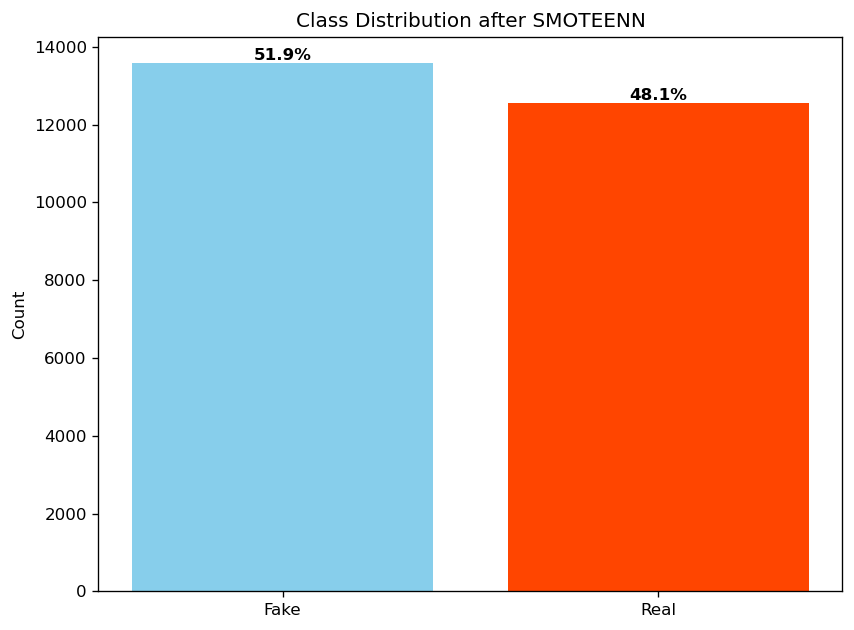

In [131]:
def plot_class_distribution_after_smoteenn(counts_resampled, title='Class Distribution after SMOTEENN'):
    """
    Plots the class distribution after applying SMOTEENN.

    :param counts_resampled: Pandas Series containing the value counts of the resampled classes.
    :param title: Title of the plot.
    """
    import matplotlib.pyplot as plt

    # Create labels based on the indices of the counts_resampled Series
    fraud_labels = counts_resampled.index.map({0: "Real", 1: "Fake"}).tolist()

    # Calculate percentages
    total_count = counts_resampled.sum()
    percentages = (counts_resampled / total_count) * 100

    # Create a vertical bar chart
    plt.figure(figsize=(8, 6), dpi=120)
    bars = plt.bar(fraud_labels, counts_resampled.values, color=['skyblue', 'orangered'])
    plt.ylabel('Count')
    plt.title(title)

    # Add percentage labels on the bars
    for bar, percentage in zip(bars, percentages):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentage:.1f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')

    plt.show()

# Run the function
plot_class_distribution_after_smoteenn(fraud_counts_resampled)


In [132]:
# Now scale the resampled training data
scaler = StandardScaler()
X_train_resampled_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)  # Only transform the test set, do not fit


In [133]:
# Convert back to dataframes after scaling 
# Convert X_train_resampled_scaled to a DataFrame
X_train_resampled_scaled_df = pd.DataFrame(X_train_resampled_scaled, columns=X_train.columns)

# Convert X_test_scaled to a DataFrame
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Print to see output 
X_train_resampled_scaled_df.head(1)

,telecommuting,has_company_logo,has_questions,required_experience,required_education,country_latitude,country_longitude,employment_type_Contract,employment_type_Full-time,employment_type_Other,...,vec_290,vec_291,vec_292,vec_293,vec_294,vec_295,vec_296,vec_297,vec_298,vec_299
0,-0.219292,0.899274,-0.749594,-1.451316,0.935908,0.065773,-0.530984,-0.25145,0.448609,-0.09848,...,0.663811,0.646642,-0.012794,-0.262782,1.309517,-0.29515,-1.289356,0.65884,0.482448,-1.088819


In [134]:
# Export this to a csv file 
# These csv files can be used to train and test the models
X_train_resampled_scaled_df.to_csv('df_model_train.csv', index=False)
X_test_scaled_df.to_csv('df_model_test.csv', index=False)

<a id="D"></a>

# D: Models

Model performance was compared across this section using measures including confusion matrix, precision, recall, and accuracy. These definitions, as well as definitions for each model employed, are detailed in the Appendix.

<a id="D1"></a>
## D1: Logistic Regression

<a id="D1.1"></a>
### Feature Selection

We aim to streamline our model by selecting the most relevant independent variables, ranked using Pearson’s correlation coefficient. This will identify their relationship with the dependent variable for inclusion in our logistic regression model.

In [135]:
# Read the csv file
X_train = pd.read_csv("df_model_train.csv")
X_train.head(1)

X_test = pd.read_csv("df_model_test.csv")
X_test.head(1)

,telecommuting,has_company_logo,has_questions,required_experience,required_education,country_latitude,country_longitude,employment_type_Contract,employment_type_Full-time,employment_type_Other,...,vec_290,vec_291,vec_292,vec_293,vec_294,vec_295,vec_296,vec_297,vec_298,vec_299
0,-0.219292,0.899274,-0.749594,-1.451316,0.935908,0.065773,-0.530984,-0.25145,0.448609,-0.09848,...,0.663811,0.646642,-0.012794,-0.262782,1.309517,-0.29515,-1.289356,0.65884,0.482448,-1.088819


,telecommuting,has_company_logo,has_questions,required_experience,required_education,country_latitude,country_longitude,employment_type_Contract,employment_type_Full-time,employment_type_Other,...,vec_290,vec_291,vec_292,vec_293,vec_294,vec_295,vec_296,vec_297,vec_298,vec_299
0,-0.219292,0.899274,-0.749594,0.872616,0.689959,0.065773,-0.530984,-0.25145,0.448609,-0.09848,...,-0.979461,-2.331746,-1.688475,-1.338571,-0.537262,0.493439,-0.61842,-0.173033,-0.593367,0.871816


In [136]:
# Get the features' name
header = []
for col in X_train.columns:
    header.append(col)

In [137]:
# Pearson's correlation feature selection for numeric input and numeric output
"""
Select features using 'SelectKBest' funciton.
    
The idea here is we run regressions for each individual features(x) against y, 
and print F-statistics for each of the regression model.
    
Larger F-statistics means the feature is more relevant.
"""

# Feature Selection
fs = SelectKBest(score_func=f_regression, k='all')
X_selected = fs.fit_transform(X_train_resampled_scaled, y_train_resampled)

# Print the scores for each feature
Fscore_df = pd.DataFrame(columns = ['Feature', 'Score'])
for i in range(len(fs.scores_)):
    temp = [header[i], fs.scores_[i]]
    Fscore_df.loc[i] = temp
    
print(Fscore_df)

"\nSelect features using 'SelectKBest' funciton.\n    \nThe idea here is we run regressions for each individual features(x) against y, \nand print F-statistics for each of the regression model.\n    \nLarger F-statistics means the feature is more relevant.\n"

                 Feature         Score
0          telecommuting     27.885276
1       has_company_logo  11973.239242
2          has_questions   2686.638696
3    required_experience    181.346335
4     required_education     42.889321
..                   ...           ...
364              vec_295      1.691132
365              vec_296    944.635442
366              vec_297    117.811863
367              vec_298     22.748384
368              vec_299    482.042873

[369 rows x 2 columns]


In [138]:
# Explore the Score distribution
Fscore_df.describe()

fig = px.box(Fscore_df, y='Score')
fig.show()

,Score
count,369.000000
mean,424.108197
std,817.436390
min,0.002779
25%,40.527865
50%,167.048232
75%,489.165574
max,11973.239242


The boxplot shows many outliers above 1174. Our feature selection method is:
1. Choose features with an F-score over 1174 as independent variables.
2. Calculate the mean F-score for non-outliers and select features above this mean.


In [139]:
# Create a new dataframe with F-score greater than 1174
Fscore_select_1 = Fscore_df.loc[(Fscore_df['Score'] > 1174)]
print(Fscore_select_1)

# Create a new dataframe with F-score less than 1173 and find the mean
Fscore_select_2_temp = Fscore_df.loc[(Fscore_df['Score'] < 1174)]
Fscore_select_2_temp.head()
Fscore_select_2_temp.describe()

                              Feature         Score
1                    has_company_logo  11973.239242
2                       has_questions   2686.638696
6                   country_longitude   1181.608481
53      industry_Energy and Utilities   1258.735284
65   industry_Technology and Software   1349.660583
90                             vec_21   1674.524355
100                            vec_31   2331.218496
113                            vec_44   1174.479637
117                            vec_48   2726.158991
133                            vec_64   1798.736488
179                           vec_110   1944.575117
185                           vec_116   2956.393118
188                           vec_119   1494.967641
194                           vec_125   2141.691888
196                           vec_127   1384.367759
197                           vec_128   1751.845315
205                           vec_136   1461.090790
215                           vec_146   1451.182745
223         

,Feature,Score
0,telecommuting,27.885276
3,required_experience,181.346335
4,required_education,42.889321
5,country_latitude,337.991814
7,employment_type_Contract,319.203595


,Score
count,334.000000
mean,248.570657
std,283.031314
min,0.002779
25%,30.330639
50%,117.225815
75%,368.534569
max,1136.047722


In [140]:
# From the new dataframe with F-score less than 1174, create another new dataframe with F-score greater than the mean (i.e. 246)
Fscore_select_2 = Fscore_select_2_temp.loc[(Fscore_select_2_temp['Score'] > 246)]
Fscore_select_2.describe()

# Final Feature Selection
feature_selection_df = pd.concat([Fscore_select_1, Fscore_select_2], axis=0)
feature_selection_df.head()
feature_selection_df.describe()

,Score
count,123.000000
mean,552.499291
std,251.622292
min,249.530675
25%,319.997647
50%,481.866136
75%,710.517695
max,1136.047722


,Feature,Score
1,has_company_logo,11973.239242
2,has_questions,2686.638696
6,country_longitude,1181.608481
53,industry_Energy and Utilities,1258.735284
65,industry_Technology and Software,1349.660583


,Score
count,158.000000
mean,895.131254
std,1081.485005
min,249.530675
25%,371.540873
50%,624.262273
75%,1087.958043
max,11973.239242


In [141]:
"""
From the above process, 155 features (i.e., indpendent variables) were selected to train the model. 
Therefore, for convenience, we creates 2 datasets for both X_train and X_test, 
which only includ the selected features.
"""

# Create a new X_train dataframe with the 155 selected features
X_train_new = pd.DataFrame(columns=[i for i in feature_selection_df["Feature"]])

# Append the original data into this new X_train dataframe
X_train_new = X_train[X_train_new.columns]
# X_train_new.head()
# X_train_new.describe()


# Create a new X_test dataframe with the 155 selected features
X_test_new = pd.DataFrame(columns=[i for i in feature_selection_df["Feature"]])

# Append the original data into this new X_test dataframe
X_test_new = X_test[X_test_new.columns]
# X_test_new.head()
# X_test_new.describe()

'\nFrom the above process, 155 features (i.e., indpendent variables) were selected to train the model. \nTherefore, for convenience, we creates 2 datasets for both X_train and X_test, \nwhich only includ the selected features.\n'

#### Train the Model

In [142]:
# Train the logistic using training dataset
logreg = LogisticRegression(random_state=16)
logreg.fit(X_train_new, y_train_resampled)

LogisticRegression(random_state=16)

#### Find the most significant variables (Top 20)

The most important feature is ‘has_company_logo’, confirming earlier findings that postings without logos are often fraudulent. Additionally, 'country_longitude', suggesting a higher deception rate in certain longitudes, and 'industry_Energy and Utilities' , both are found to be important predictive features, consistent with previous observations. 

has_company_logo                 1.554813
country_longitude                1.041520
function_Health Care Provider    0.974808
vec_60                           0.876939
vec_188                          0.723766
country_latitude                 0.702175
vec_31                           0.696859
vec_38                           0.672451
vec_37                           0.649211
industry_Energy and Utilities    0.647808
vec_275                          0.642664
vec_117                          0.640723
vec_230                          0.618808
vec_253                          0.610934
vec_187                          0.602559
industry_Not Specified           0.569364
vec_143                          0.565126
vec_236                          0.555021
vec_146                          0.552805
vec_119                          0.548347
dtype: float64


<Axes: >

Text(0.5, 1.0, 'Top 20 Most Important Features in Logistic Regression')

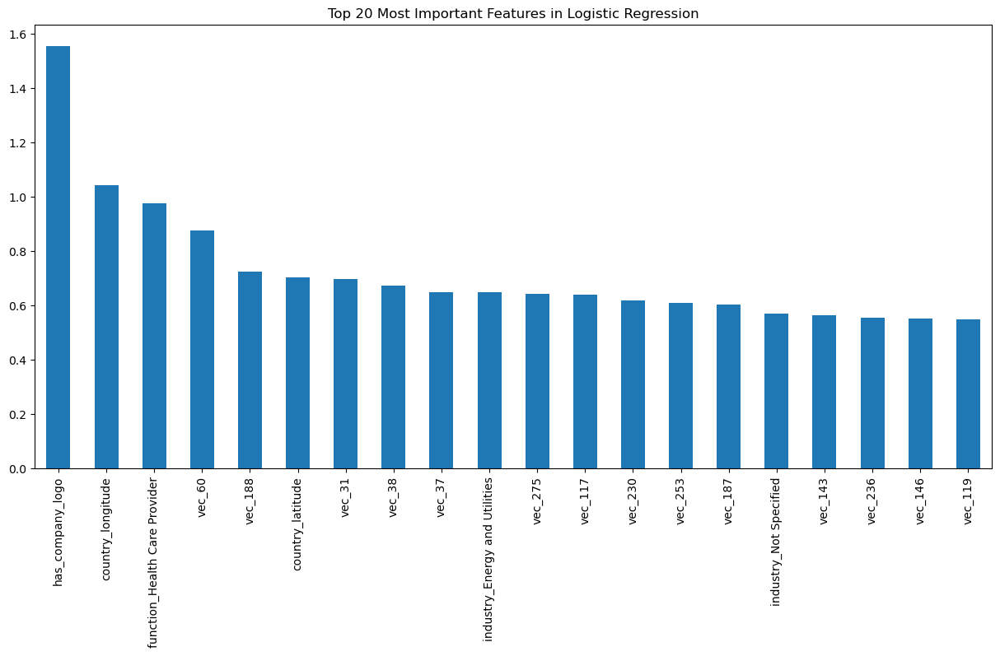

In [144]:
# Retrieve the model's coefficients
coefficients = logreg.coef_[0]

# Calculate the absolute values of the coefficients
importance = np.abs(coefficients)

# Get the indices of the top 20 variables
top20_indices = np.argsort(importance)[-20:]

# Get the names of the top 20 variables
feature_names = np.array(X_train_new.columns)
top20_features = feature_names[top20_indices][::-1]

# Display the coefficients along with feature names:
top20_importance = importance[top20_indices][::-1]
feature_importance_logit = pd.Series(index = top20_features, data = top20_importance)
print(feature_importance_logit)

# Plot the top 20 most important features
fig = plt.figure(figsize =(15, 7))
feature_importance_logit.plot.bar()
plt.title("Top 20 Most Important Features in Logistic Regression")  # Title for the plot
plt.show()


<a id="D1.2"></a>
### Model performance

Despite an overall accuracy of 0.89, this figure may be misleading. The model effectively identifies 'Real' cases but struggles with 'Fake' cases, as shown by a low 0.29 precision score for 'Fake'. Next, we plan to train a random forest model to potentially enhance performance. 

In [146]:
# Use the testing dataset to make prediction on whether the job post is fake or not
y_predict_logit = logreg.predict(X_test_new)

array([[3020,  383],
       [  29,  144]])

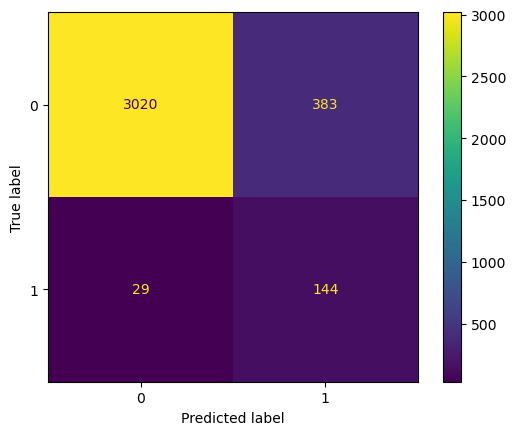

In [147]:
# Build the confusion matrix using predicted value and the actual value
cnf_matrix_logit = metrics.confusion_matrix(y_test, y_predict_logit)
cnf_matrix_logit

# Visualise the confusion matrix
metrics.ConfusionMatrixDisplay(confusion_matrix=cnf_matrix_logit).plot()

In [148]:
# Summarise the accuracy of the model
from sklearn.metrics import classification_report
target_names = ['Real', 'Fake']
print(classification_report(y_test, y_predict_logit, target_names=target_names))

# Print the accuracy score of the model
accuracy_logit = metrics.accuracy_score(y_test, y_predict_logit)
print("Accuracy:", accuracy_logit)

              precision    recall  f1-score   support

        Real       0.99      0.89      0.94      3403
        Fake       0.27      0.83      0.41       173

    accuracy                           0.88      3576
   macro avg       0.63      0.86      0.67      3576
weighted avg       0.96      0.88      0.91      3576

Accuracy: 0.8847874720357942


<a id="D2"></a>
## Random Forest

<a id="D2.1"></a>
### Random Forest with Default Argument

In [149]:
# Build the random forest
rf1 = RandomForestClassifier(random_state=16)
rf1.fit(X_train, y_train_resampled)

RandomForestClassifier(random_state=16)

In [150]:
# Check the numbr of tree in the forest
No_of_Tree_in_rf1 = "There are " + str(len(rf1.estimators_)) + " trees in the forest."
print(No_of_Tree_in_rf1)

There are 100 trees in the forest.


#### Find the most significant variables (Top 20)

The features 'has_company_logo', 'industry_Energy and Utilities', and 'country_longitude' are still the most significant predictors. 'country_latitude' emerges as an additional key feature, highlighting the geographic location's importance in identifying fraudulence. Another important feature is ‘has_question’, aligning with our previous finding that job postings with questions are less likely to be fake.

has_company_logo     0.060639
country_latitude     0.023456
country_longitude    0.015306
vec_171              0.014539
vec_256              0.014029
vec_48               0.013172
vec_116              0.012867
has_questions        0.012642
vec_127              0.012194
vec_262              0.011461
vec_133              0.011085
vec_230              0.010287
vec_64               0.010269
vec_31               0.009290
vec_252              0.008933
vec_128              0.007638
vec_125              0.007601
vec_180              0.006866
vec_119              0.006813
vec_23               0.006786
dtype: float64


<Axes: >

Text(0.5, 1.0, 'Top 20 Most Important Features in Random Forest with Default Argument')

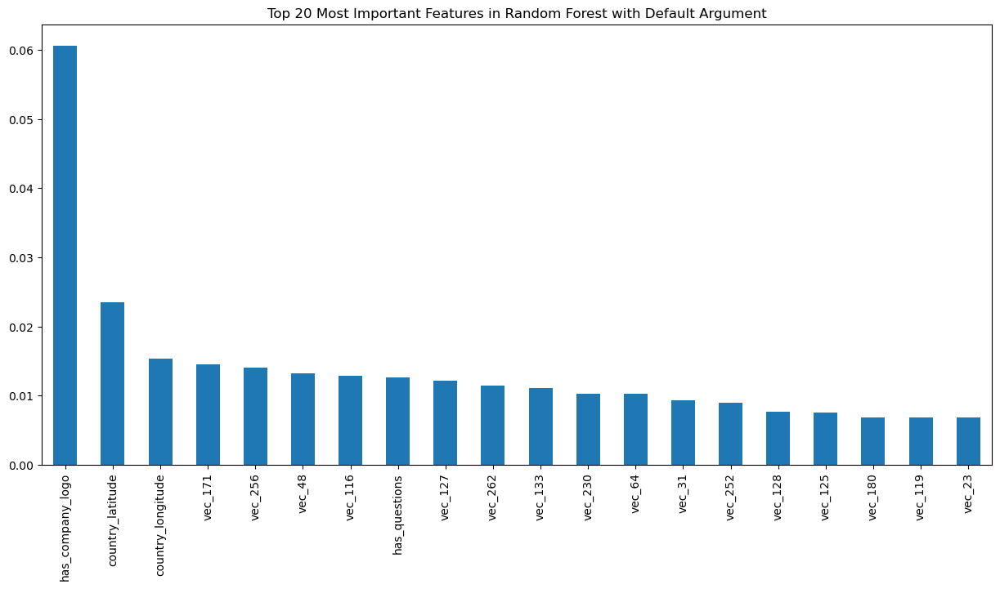

In [151]:
# Find the first 20 important features based on Gini Importance
feature_importance_rf1 = (pd.Series(rf1.feature_importances_, 
                                    index=X_train.columns).sort_values(ascending=False))[0:20]
print(feature_importance_rf1)

# Plot the top 20 most important features
fig = plt.figure(figsize =(15, 7))
feature_importance_rf1.plot.bar()
plt.title("Top 20 Most Important Features in Random Forest with Default Argument")  # Title for the plot
plt.show()

<Figure size 1500x800 with 0 Axes>

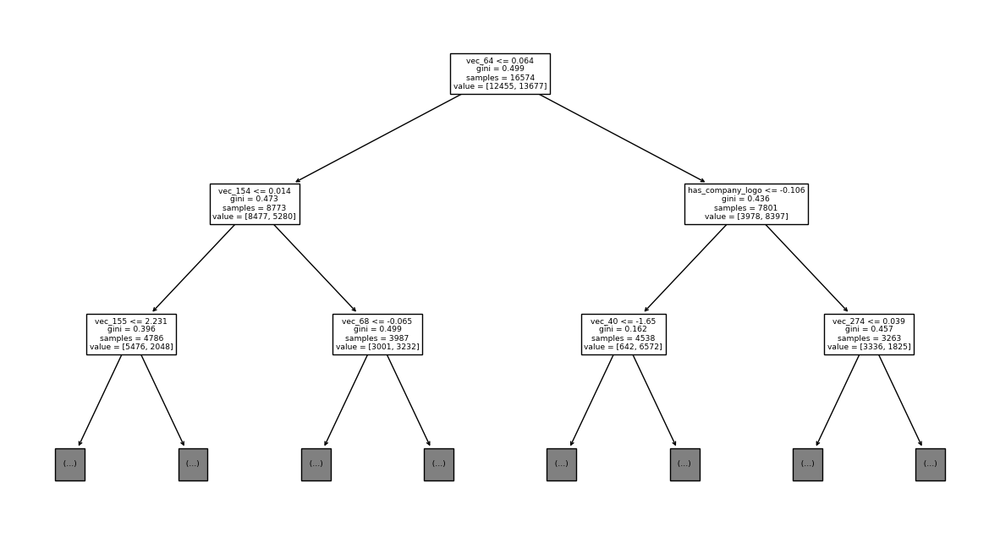

In [152]:
# Plot a sample decision tree from the forest
plt.figure(figsize=(15,8))
fig = tree.plot_tree(rf1.estimators_[0], max_depth=2, feature_names = list(X_train.columns)) 

In [153]:
# Make the prediction
y_predict_rf1 = rf1.predict(X_test)

<a id="D2.2"></a>
### Model performance

The model shows improved precision for 'Fake' at 0.87, indicating 87% of classified 'Fake' postings are truly fraudulent. Overall accuracy has risen to 0.98. However, the 'Fake' class's lower recall score suggests the model isn't fully effective at identifying all fraudulent postings. Next steps include applying hyperparameter tuning to a random forest model for further enhancement

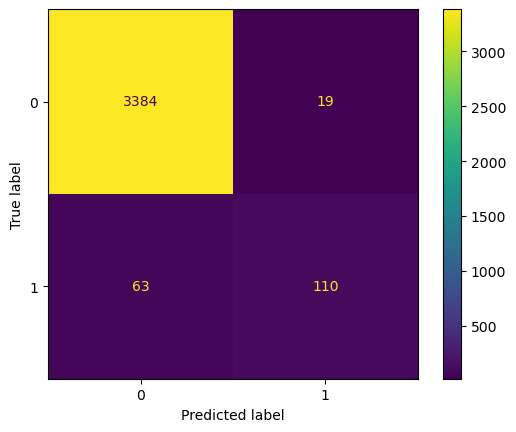

In [154]:
# Confusion matrix
cnf_matrix_rf1 = metrics.confusion_matrix(y_test, y_predict_rf1)

metrics.ConfusionMatrixDisplay(confusion_matrix=cnf_matrix_rf1).plot()

In [155]:
# Summarise the accuracy of the model
target_names = ['Real', 'Fake']
print(classification_report(y_test, y_predict_rf1, target_names=target_names))

# Print the accuracy score of the model
accuracy_rf1 = metrics.accuracy_score(y_test, y_predict_rf1)
print("Accuracy:", accuracy_rf1)

              precision    recall  f1-score   support

        Real       0.98      0.99      0.99      3403
        Fake       0.85      0.64      0.73       173

    accuracy                           0.98      3576
   macro avg       0.92      0.82      0.86      3576
weighted avg       0.98      0.98      0.98      3576

Accuracy: 0.977069351230425


<a id="D2.3"></a>
### Random Forest with best estimators (Hyperparameter Tuning)

In [156]:
param_dist = {'n_estimators': randint(50,500),
              'max_depth': randint(1,20)}

# Create a random forest classifier
rf2 = RandomForestClassifier()

# Use random search to find the best hyperparameters
rand_search = RandomizedSearchCV(rf2, 
                                 param_distributions = param_dist, 
                                 n_iter=5, 
                                 cv=5)

# Fit the random search object to the training dataset
rand_search.fit(X_train, y_train_resampled)

# Print the best estimator
best_rf = rand_search.best_estimator_
print(best_rf)

"""
From the hyperparameter tuning result, 
the best random forest estimators are 315 individual trees, 
with the maximum depth being 18.
"""

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=5,
                   param_distributions={'max_depth': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7fdc9ce492b0>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7fdc64fca5e0>})

RandomForestClassifier(max_depth=18, n_estimators=341)


'\nFrom the hyperparameter tuning result, \nthe best random forest estimators are 315 individual trees, \nwith the maximum depth being 18.\n'

#### Find the most significant variables (Top 20)

The results indicate that this model retains a set of important features that are largely consistent with those identified by the random forest model using default settings. 

has_company_logo     0.067882
country_latitude     0.024155
vec_262              0.014882
country_longitude    0.014277
vec_133              0.013719
vec_171              0.011722
has_questions        0.011655
vec_128              0.011645
vec_31               0.011321
vec_127              0.011267
vec_256              0.010891
vec_116              0.010757
vec_252              0.010302
vec_230              0.010250
vec_48               0.010075
vec_64               0.008002
vec_180              0.007974
vec_119              0.006971
vec_125              0.006904
vec_93               0.006420
dtype: float64


<Axes: >

Text(0.5, 1.0, 'Top 20 Most Important Features in Random Forest with Hyperparameter Tuning')

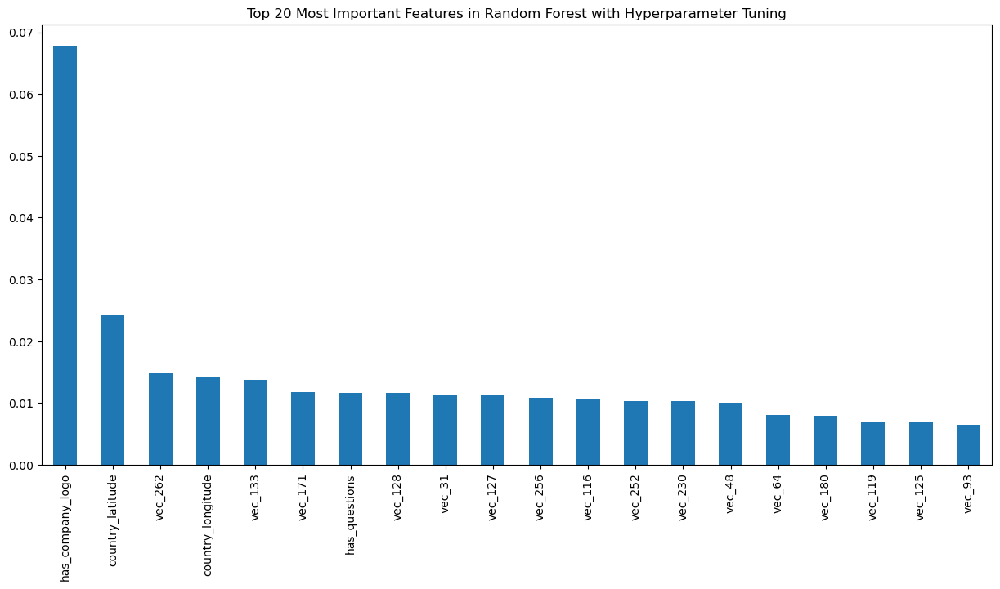

In [157]:
# Find the first 20 important features based on Gini Importance
feature_importance_rf2 = (pd.Series(best_rf.feature_importances_,
                                    index=X_train.columns).sort_values(ascending=False))[0:20]
print(feature_importance_rf2)

# Plot the top 20 most important features
fig = plt.figure(figsize =(15, 7))
feature_importance_rf2.plot.bar()
plt.title("Top 20 Most Important Features in Random Forest with Hyperparameter Tuning")  # Title for the plot
plt.show()


<Figure size 1500x800 with 0 Axes>

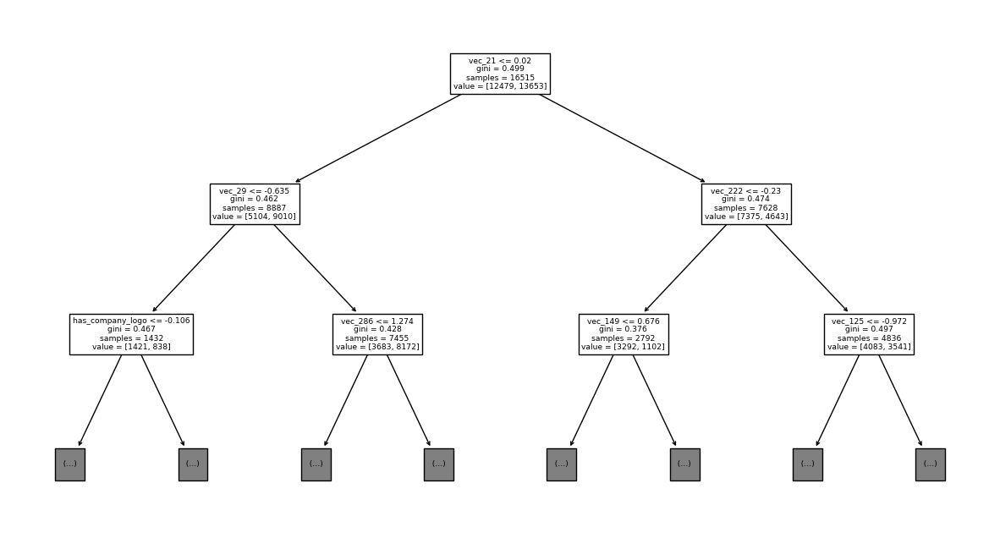

In [158]:
# Plot a sample decision tree from the forest
plt.figure(figsize=(15,8))
fig = tree.plot_tree(best_rf.estimators_[0], max_depth=2, feature_names = list(X_train.columns)) 

<a id="D2.4"></a>
### Model performance

Relative to the previous model, there's a slight enhancement in the recall score for the 'Fake' class, though the extent of the improvement is marginal. The precision scores and overall accuracy closely resemble those of the random forest model with default arguments. Consequently, we have resolved to explore more robust machine learning algorithms, including SVM and XGBoost, to determine whether they can deliver more substantial improvements.

In [159]:
# Make the prediction
y_predict_rf2 = best_rf.predict(X_test)

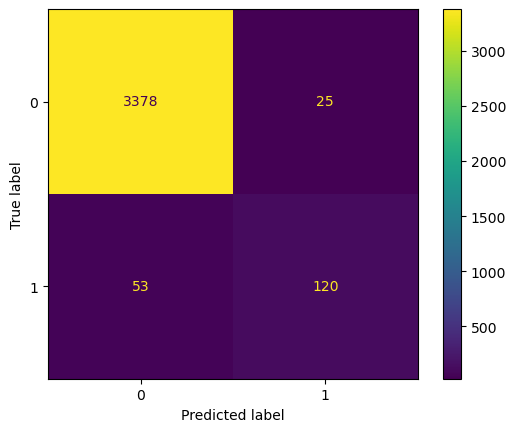

In [160]:
# Confusion matrix
cnf_matrix_rf2 = metrics.confusion_matrix(y_test, y_predict_rf2)

metrics.ConfusionMatrixDisplay(confusion_matrix=cnf_matrix_rf2).plot()

In [161]:
# Summarise the accuracy of the model
target_names = ['Real', 'Fake']
print(classification_report(y_test, y_predict_rf2, target_names=target_names))

# Print the accuracy score of the model
accuracy_rf2 = metrics.accuracy_score(y_test, y_predict_rf2)
print("Accuracy:", accuracy_rf2)

              precision    recall  f1-score   support

        Real       0.98      0.99      0.99      3403
        Fake       0.83      0.69      0.75       173

    accuracy                           0.98      3576
   macro avg       0.91      0.84      0.87      3576
weighted avg       0.98      0.98      0.98      3576

Accuracy: 0.9781879194630873


<a id="D3"></a>
## Support Vector Machines (SVM)

In [ ]:
#Create a svm Classifier
svm = svm.SVC(kernel='linear') # Linear Kernel

#Train the model using the training sets
svm.fit(X_train, y_train_resampled)

<a id="D3.1"></a>
### Model performance

The SVM model excels in identifying fraudulent job postings, with a recall of 0.78. The overall accuracy of the model is also commendable, standing at 0.94. However, its lower precision for 'Fake' indicates many postings are wrongly marked as fraudulent. 

In [89]:
#Predict the response for test dataset
y_predict_svm = svm.predict(X_test)

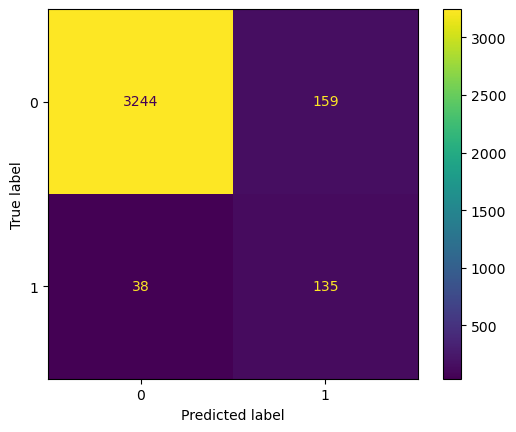

In [90]:
# Confusion matrix
cnf_matrix_svm= metrics.confusion_matrix(y_test, y_predict_svm)

metrics.ConfusionMatrixDisplay(confusion_matrix=cnf_matrix_svm).plot()

In [91]:
# Summarise the accuracy of the model
target_names = ['Real', 'Fake']
print(classification_report(y_test, y_predict_svm, target_names=target_names))

# Print the accuracy score of the model
accuracy_svm = metrics.accuracy_score(y_test, y_predict_svm)
print("Accuracy:", accuracy_svm)

              precision    recall  f1-score   support

        Real       0.99      0.95      0.97      3403
        Fake       0.46      0.78      0.58       173

    accuracy                           0.94      3576
   macro avg       0.72      0.87      0.77      3576
weighted avg       0.96      0.94      0.95      3576

Accuracy: 0.944910514541387


<a id="D4"></a>
## XGBoost Classifier

In [92]:
xgb_classifier = xgb.XGBClassifier(n_estimators=100, objective='binary:logistic', 
                                   tree_method='hist', eta=0.1, 
                                   max_depth=3, enable_categorical=True)

xgb_classifier.fit(X_train, y_train_resampled)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=True, eta=0.1, eval_metric=None,
              feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, predictor=None, ...)

#### Find the most significant variables (Top 20)

The important features remain consistent with earlier models. However, interestingly, a new feature ‘required_educatin’ emerges as a significant predictor, a finding we did not reach in our visualisations. 

has_company_logo                 0.047018
country_longitude                0.028517
vec_133                          0.022467
vec_46                           0.021902
vec_168                          0.018813
vec_53                           0.018450
vec_44                           0.018435
vec_256                          0.018021
vec_22                           0.017433
country_latitude                 0.017219
industry_Energy and Utilities    0.015754
vec_116                          0.014224
function_Engineering             0.014141
vec_127                          0.013994
vec_190                          0.011744
vec_128                          0.011465
vec_154                          0.011400
vec_64                           0.011080
vec_171                          0.010998
required_education               0.010586
dtype: float32


<Axes: >

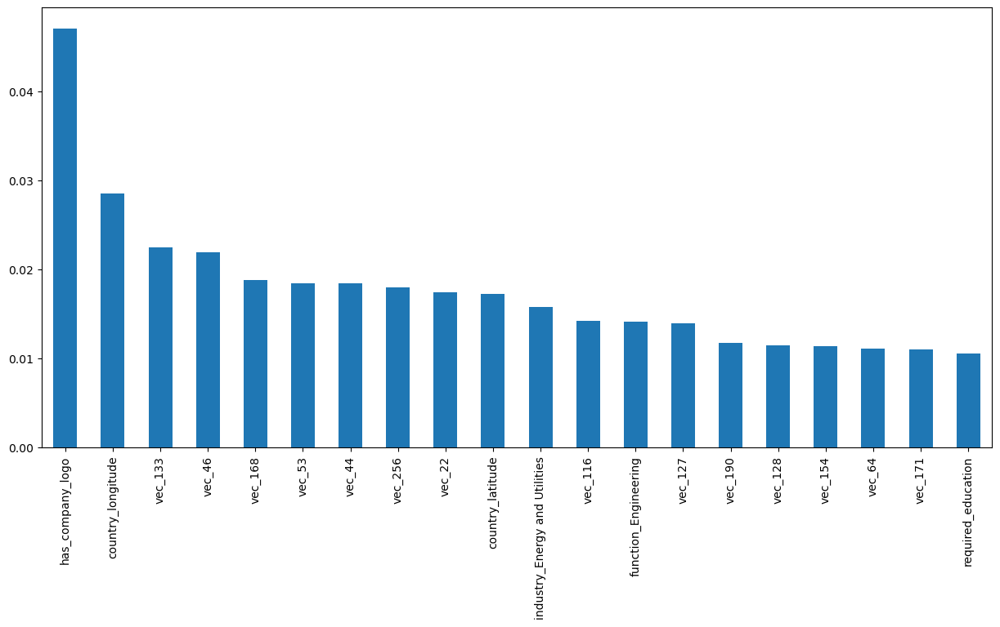

In [93]:
# Find the first 20 important features
feature_importance_xgb = (pd.Series(xgb_classifier.feature_importances_,
                                    index=X_train.columns).sort_values(ascending=False))[0:20]
print(feature_importance_xgb)

# Plot the top 20 most important features
fig = plt.figure(figsize =(15, 7))
feature_importance_xgb.plot.bar()
plt.title("Top 20 Most Important Features in XGBoost Classifier")  # Adding title for the plot
plt.show()

<a id="D4.1"></a>
### Model performance

The results show that the XGBoost Classifier model matches the SVM in overall accuracy. There's an additional enhancement in the model's capability to identify fraudulent job postings. However, this comes at the cost of a more pronounced decrease in the precision score for the 'Fake' category.

In [94]:
y_predict_xgb = xgb_classifier.predict(X_test)

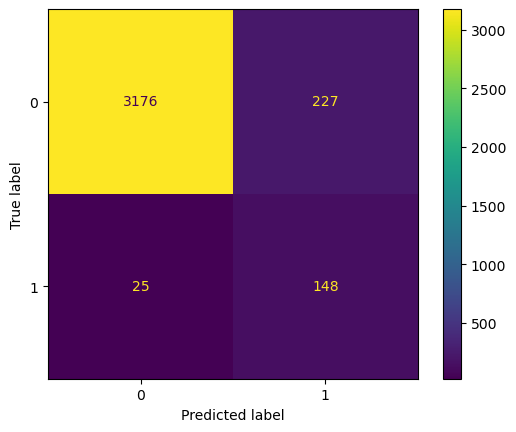

In [95]:
# Confusion matrix
cnf_matrix_xgb= metrics.confusion_matrix(y_test, y_predict_xgb)

metrics.ConfusionMatrixDisplay(confusion_matrix=cnf_matrix_xgb).plot()

In [97]:
# Summarise the accuracy of the model
target_names = ['Real', 'Fake']
print(classification_report(y_test, y_predict_xgb, target_names=target_names))

# Print the accuracy score of the model
accuracy_xgb = metrics.accuracy_score(y_test, y_predict_xgb)
print("Accuracy:", accuracy_xgb)

              precision    recall  f1-score   support

        Real       0.99      0.93      0.96      3403
        Fake       0.39      0.86      0.54       173

    accuracy                           0.93      3576
   macro avg       0.69      0.89      0.75      3576
weighted avg       0.96      0.93      0.94      3576

Accuracy: 0.9295302013422819


<a id="D5"></a>
## Model Evaluation and comparison

The results rank the overall accuracy of all models, from highest (default random forest) to lowest (logistic regression). However, considering precision and recall, the hyperparameter-tuned random forest model is the best fit for this business scenario, balancing effective fraud detection with low misclassification rates.

In [98]:
model_name = ['Logistic Regression','Random Forest Default',
              'Radom Forest Hyperparameter Tuning', 'SVM','XGBoost Classifier']
accuracy_f1_score = [accuracy_logit, accuracy_rf1, accuracy_rf2, accuracy_svm, accuracy_xgb]
accuracy_f1_score_rounded = [round(i,3) for i in accuracy_f1_score]
accuracy_comparison = pd.Series(index = model_name, data = accuracy_f1_score_rounded)
print(accuracy_comparison.sort_values(ascending=False))

Random Forest Default                 0.978
Radom Forest Hyperparameter Tuning    0.977
SVM                                   0.945
XGBoost Classifier                    0.930
Logistic Regression                   0.889
dtype: float64


The list highlights key features consistently important across all models, including 'has_company_logo', 'country_longitude', 'country_latitude', and 'industry_Energy and Utilities'. This aligns with prior data visualisation showing significant differences in real vs. fake job posting distributions in these categories.

In [99]:
important_features = pd.DataFrame(set(feature_importance_logit.index) | set(feature_importance_rf1.index) | set(feature_importance_rf2.index) | set(feature_importance_xgb.index))
print(important_features)

                                0
0   function_Health Care Provider
1                has_company_logo
2                         vec_180
3                         vec_127
4                         vec_187
5              required_education
6   industry_Energy and Utilities
7                          vec_75
8                          vec_53
9                         vec_256
10                        vec_128
11                        vec_119
12                        vec_146
13                        vec_171
14                        vec_190
15                         vec_31
16                        vec_168
17                         vec_64
18                  has_questions
19                        vec_188
20                         vec_22
21              country_longitude
22                        vec_275
23                        vec_143
24                        vec_230
25                        vec_227
26                         vec_48
27                        vec_262
28            

<a id="CONC"></a>
# Conclusion 

In the context of modern Cloud-based ATS, our project focused on combating the rise in recruitment fraud—a significant by-product of these systems.

Our exploratory data visualisations, initially highlighted key variables and patterns associated with fraudulent job listings. Subsequently, our predictive models reinforced these findings, aligning with the insights gained from the visualisations. 

A limitation of our analysis is that it did not examine the connection between missing values and fraudulent classification. While we were conscious of whether missing values could be an indicator of fraudulence throughout the project, particularly during the imputation of missing values, a more detailed investigation could prove beneficial. Another limitation was our lack of exploration into the specific semantic contexts and relationships captured by individual dimensions in our word embeddings, like 'vec_60' or 'vec_108'. Examining how these dimensions influence model predictions could have provided additional insights into the semantic patterns detecting fraud in job postings.

To conclude, our project effectively combines machine learning and exploratory data analysis in addressing recruitment fraud within ATS systems.  However, our findings might not be universally generalisable due to dataset limitations such as outdated information from 2012-2014, potentially missing recent fraud tactics, a relatively small sample of 17,880 job descriptions, and significant missing data in potential key variables like salary. Despite these challenges, we believe our methodologies and analytical frameworks offer a valuable template. These could be adapted and applied to more extensive and diverse job posting datasets, like those of major platforms such as LinkedIn, for more comprehensive insights.


<a id="App"></a>
# Appendix 

<a id="App1"></a>
## 1. Error Matrix Definition 

The confusion matrix is a table that is used to define the performance of a classification algorithm (Batarseh & Yang, 2020). Figure x shows the 4 possible outcomes in this business scenario.


<div>
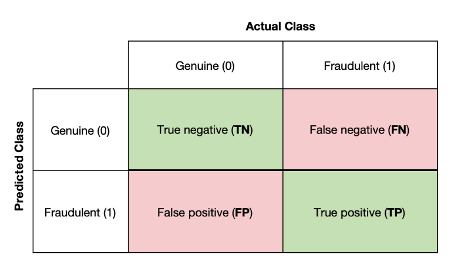
</div>

**Precision**
* Precision value ranges from 0 to 1, with 1 being the best. It is the ratio of the true positive predictions to the total number of positive predictions. In other words, it is the accuracy of the positive predictions.
 
**Recall**
* Recall value ranges from 0 to 1, with 1 being the best. It is the ratio of true positive predictions to the total number of actual positives. In other words, it measures the model’s ability to identify all relevant cases within a dataset.
 
**Accuracy**
* Accuracy value ranges from 0 to 1, with 1 being the best. It is the ratio of correct predictions to the total number of cases. In other words, it measures the overall performance of the model.


<a id="App2"></a>
## 2. Model Definitions 

**Logistic Regression** - 
Logistic regression is a process of modelling the probability of a discrete outcome given the input variables (Edgar & Manz, 2017). It is one of the most common models to apply when the target variable is a binary outcome, thus was chosen as the first model for this business problem.

**Random Forest** -
Random forest is a commonly used algorithm, which combines the output of multiple decision trees to reach a single result (IMB, n.d.). It can reduce the likelihood of overfitting. The random forest models were built through 2 different ways:
* Default Argument: We will firstly build the model without taking any constraints (i.e., a total of 100 decision trees and the maximum depth of each individual tree is none).
* Hyperparameter Tuning: We will use a random search method to find the best hyperparameter, namely the number of decision trees in the model and the maximum depth for each individual tree.

**Support Vector Machine (SVM)** - 
SVM is an algorithm used for both classification and regression. The main objective of the SVM algorithm is to find the optimal hyperplane in an N-dimensional space that can separate the data points in different classes in the feature space (Geeks for Geeks, 2023).

**XGBoost** - 
XGBoost is an ensemble learning method. Ensemble learning offers a systematic solution to combine the predictive power of multiple learners. The resultant is a single model which gives the aggregated output from several models (Guest, 2023). Due to this reason, XGBoost can usually provide more accurate prediction results that outperform other machine learning models. Therefore, XGBoost model was trained as the last step for this business problem.

<a id="App3"></a>
## 3. Artifical General Intelligence Usage 

This section outlines our usage for AGI in the assignment. 

**Data Cleaning:** In this stage, ChatGPT played a key role in correcting errors. It also served as a valuable resource for explaining NLP techniques and concepts for a beginner, thus enriching our foundational knowledge before drawing on other sources for the actual coding in this section. ChatGPT also proved invaluable in the labour-intensive task of categorising over 130 unique industry values into broader groups, significantly easing this manual process.

**Visualisations:** ChatGPT's contribution here centred on aesthetic enhancement, not the direct creation of them. It provided outputs based on questions on how to make the data visualisations more visually appealing and informative. This included advice on improving image quality, ensuring clarity in axis labels and avoiding overlaps, and adding labels to bars for better readability. 

**Model Building:** For this component, we did not utilise ChatGPT in the coding process.

**General Usage:** ChatGPT was an invaluable asset throughout the project, particularly in refining our written content. Starting with a considerable word count, we often relied on ChatGPT to help condense and streamline our text, ensuring clarity and brevity without sacrificing key information.

Beyond ChatGPT, our project also benefited from a range of other sources, especially for coding insights. This included drawing ideas from Kaggle notebooks and Google searches, which complemented the guidance and insights provided by ChatGPT.


<a id="PM"></a>
# Project Management

Before sharing our Trello screenshots, we want to preface with an overview on our group dynamics and project management experience. Our team was highly collaborative, responsible, and efficient. We kicked off with a group call where everyone came prepared, presenting three ideas each. After the meeting, we took time to further develop our preferred ideas, aiming to select a final one in our next meeting. This process was smooth and discussion-based. Ultimately, we chose a topic that was both intriguing and challenging, involving a lot of text data and missing information. This required us to learn new skills like NLP concepts.
 
Our team of three divided the tasks: Kaylee handled data cleaning, Sam focused on visualisations, and Winnie worked on model building. We planned to complete data cleaning in one week, followed by model building and visualisations in the next. This schedule allowed us ample time to address any issues, merge notebooks, write our sections, and enhance the overall quality of our work. We had weekly meeting once a week. Below, you'll find a detailed outline of our project management journey in Trello.


<a id="PM1"></a>
## Trello 

Below 2 screenshots are the overview of our Trello dashboard, starting from w/c 23/10/23 to w/c 04/12/23.

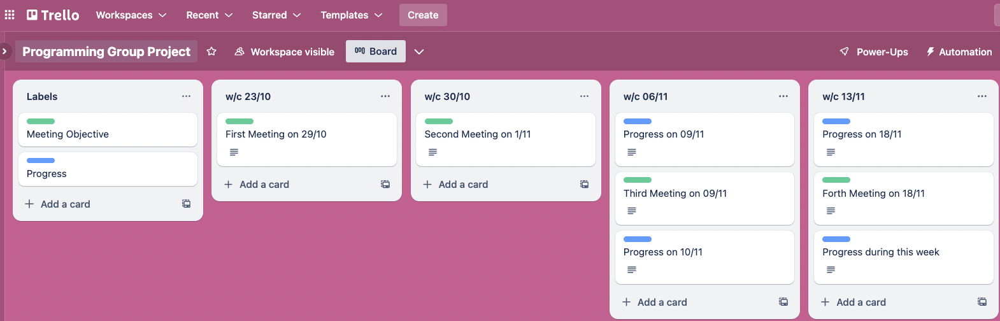

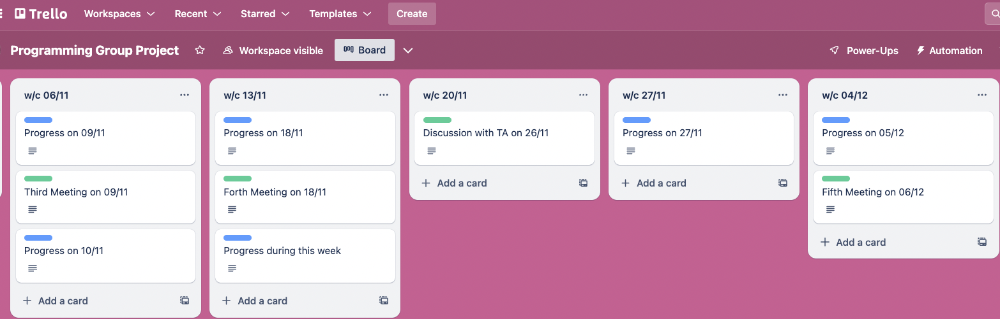

The following screenshots document all team meetings for this project, attended by all members. These meetings primarily focused on regular updates on each member's progress, encompassing discussions about the project topic, task allocation, and presentations of completed work.

<div>
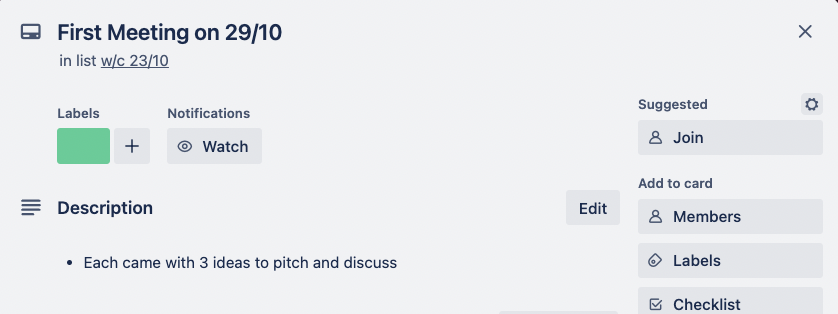
</div>

<div>
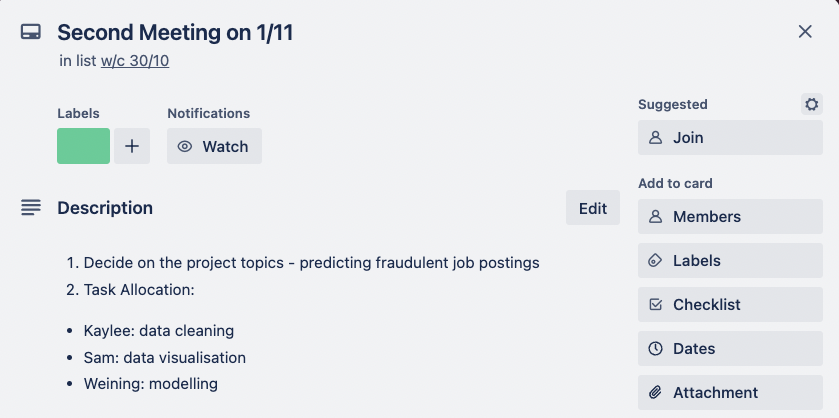
</div>

<div>
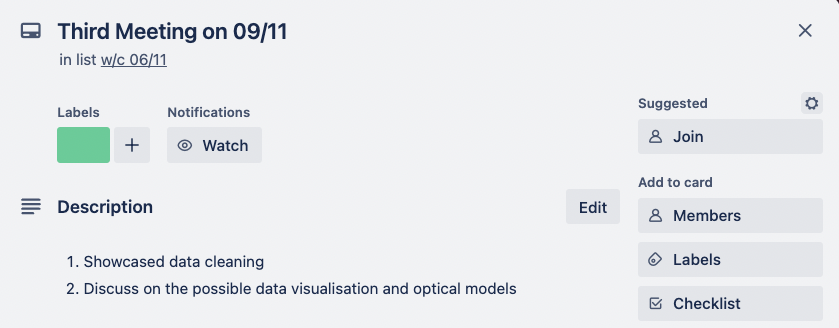
</div>

<div>
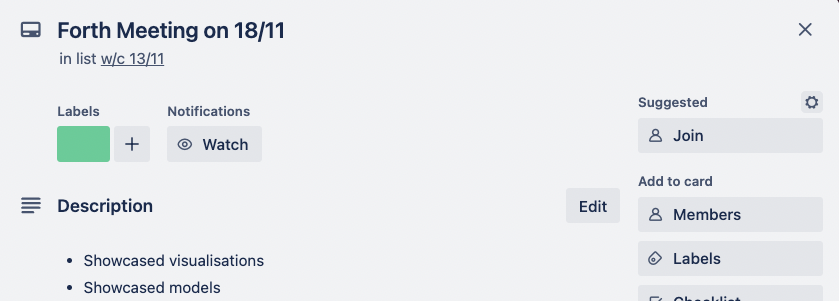
</div>

<div>
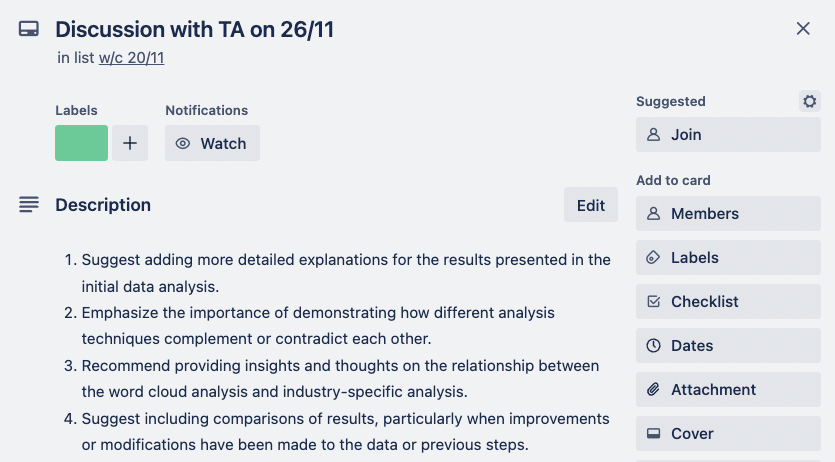
</div>

<div>
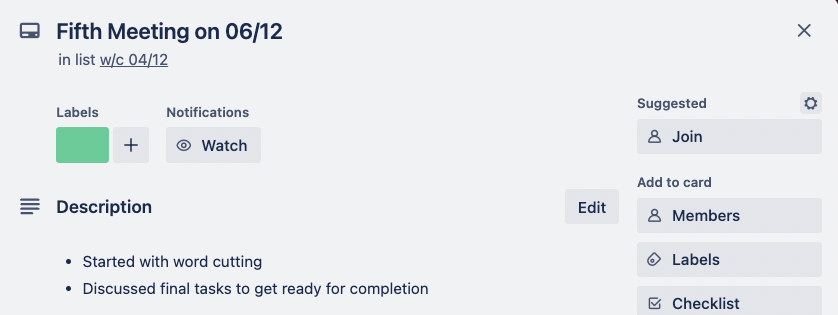
</div>

The following screenshots document our working progress, some milestones are:
* Kaylee completed the first version of data cleaning on 09/11.
* Kaylee updated the data cleaning based on the insight provided by the professor on 10/11.
* Weining completed the first version of modelling on 18/11.
* Sam completed the first version of data visualisation on 18/11.
* All codes were combined in one notebook on 21/11.
* Writing commenced on the w/c 27/11, with  some coding being further refined.

<div>
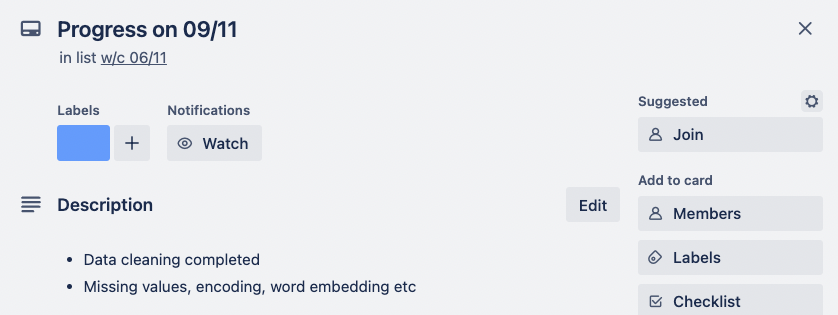
</div>

<div>
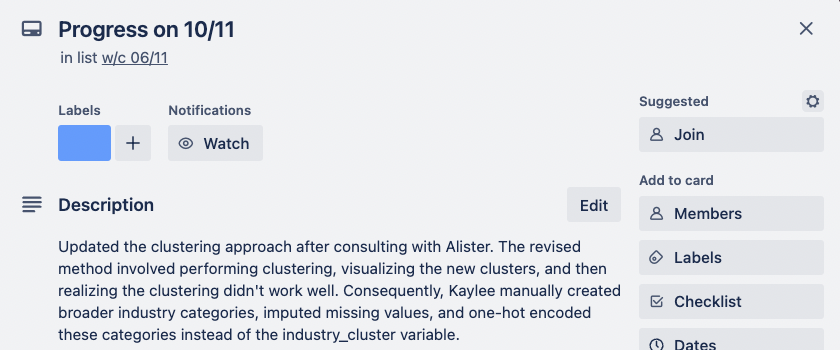
</div>

<div>
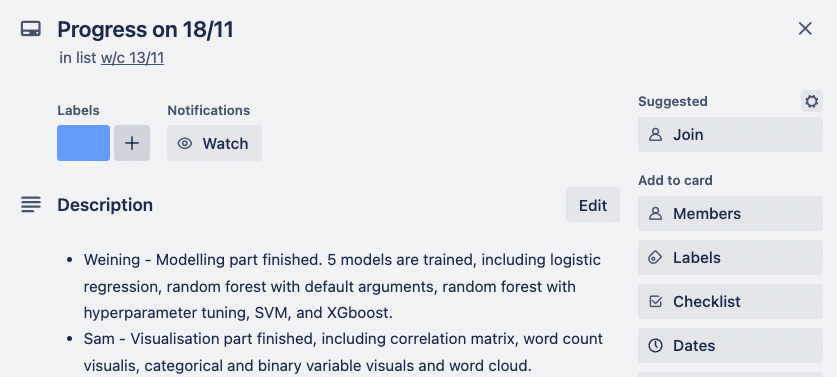
</div>

<div>
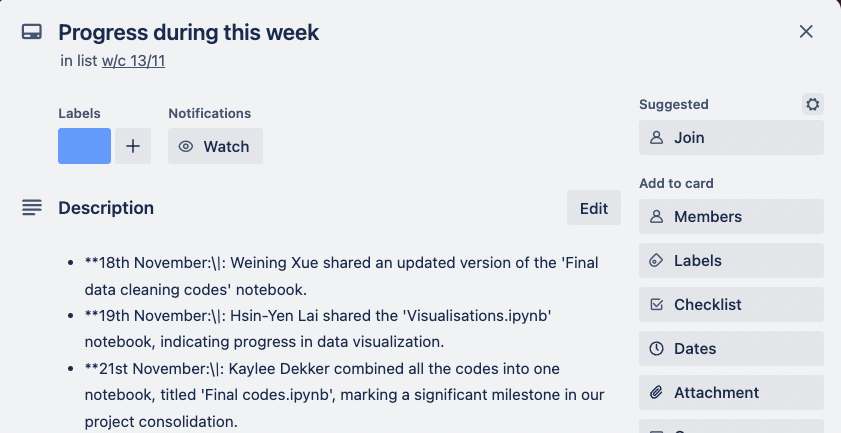
</div>

<div>
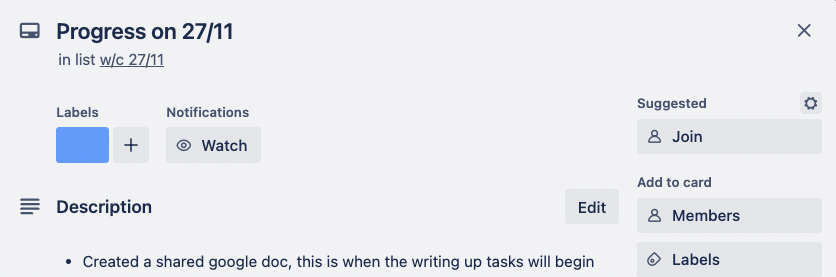
</div>

<div>
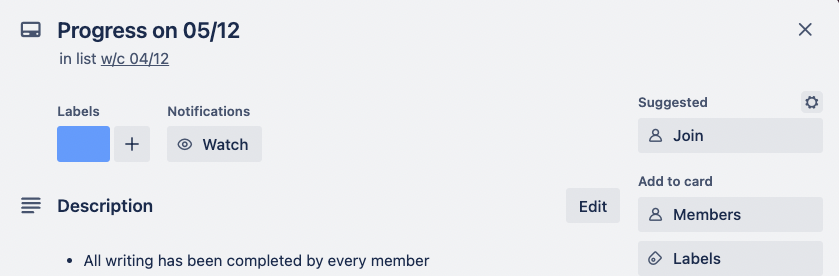
</div>

<a id="Bib"></a>
# Bibliography

Batarseh, F. A. & Yang, R., 2020. Confusion Matrix. [Online] 
Available at: https://www.sciencedirect.com/topics/engineering/confusion-matrix#:~:text=A%20confusion%20matrix%20is%20a,performance%20of%20a%20classification%20algorithm
[Accessed 3 December 2023].

Chen, S., 2020. Getting Started with Text Vectorization. [Online] 
Available at: https://towardsdatascience.com/getting-started-with-text-vectorization-2f2efbec6685
[Accessed 7 November 2023].

Edgar, T. W. & Manz, D. O., 2017. Logistic Regression. [Online] 
Available at: https://www.sciencedirect.com/topics/computer-science/logistic-regression#:~:text=Logistic%20regression%20is%20a%20process,%2Fno%2C%20and%20so%20on
[Accessed 2 December 2023].

Geeks for Geeks, 2023. Support Vector Machine (SVM) Algorithm. [Online] 
Available at: https://www.geeksforgeeks.org/support-vector-machine-algorithm/
Google Developers, 2012. Dataset Publishing Language. [Online] 
Available at: https://developers.google.com/public-data/docs/canonical/countries_csv
[Accessed 1 December 2023].

Guest, 2023. Introduction to XGBoost Algorithm in Machine Learning. [Online] 
Available at: https://www.analyticsvidhya.com/blog/2018/09/an-end-to-end-guide-to-understand-the-math-behind-xgboost/
[Accessed 3 December 2023].

Harman, P., 2017. Load Google's pre-trained Word2Vec model using gensim. [Online] 
Available at: https://github.com/harmanpreet93/load-word2vec-google
[Accessed 2 November 2023].

IMB, n.d. What is random forest?. [Online] 
Available at: https://www.ibm.com/topics/random-forest#:~:text=Random%20forest%20is%20a%20commonly,both%20classification%20and%20regression%20problems
[Accessed 3 December 2023].

Kaggle, 2019. Real / Fake Job Posting Prediction. [Online] 
Available at: https://www.kaggle.com/datasets/shivamb/real-or-fake-fake-jobposting-prediction/data
[Accessed 28 October 2023].

McCormick, C., 2016. Google's trained Word2Vec model in Python. [Online] 
Available at: https://mccormickml.com/2016/04/12/googles-pretrained-word2vec-model-in-python/
[Accessed 1 November 2023].

Singh, K. & Upadhyaya, S., 2012. Outlier Detection: Applications And Techniques. IJCSI International Journal of Computer Science Issues, 9(1).

University of the Aegean, 2017. Employment Scam Aegean Dataset. [Online] 
Available at: http://emscad.samos.aegean.gr
[Accessed 2 December 2023].

Viadinugroho, R. A. A., 2021. Imbalanced Classification in Python: SMOTE-ENN Method. [Online] 
Available at: https://towardsdatascience.com/imbalanced-classification-in-python-smote-enn-method-db5db06b8d50
[Accessed 12 November 2023].

Vidros, S., Kolias, C., Kambouraki, G. & Akoglu, L., 2017. Automatic Detection of Online Recruitment Frauds: Characteristics, Methods, and a Public Dataset. [Online] 
Available at: https://www.mdpi.com/1999-5903/9/1/6/htm
[Accessed 2 December 2023].